In [1]:
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd
import numpy as np
import seaborn as sns
from scipy.stats import kstest

from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import confusion_matrix
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.ensemble import IsolationForest

import statsmodels.api as sm
import sys

from sklearn.decomposition import PCA
from scipy.stats import bartlett
from factor_analyzer.factor_analyzer import calculate_kmo, calculate_bartlett_sphericity,FactorAnalyzer
from sklearn.preprocessing import StandardScaler
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

In [2]:
df_original = pd.read_csv('Base mesclada.csv')
print('Quantidade variaveis na base original {}'.format(df_original.columns.shape[0]))
df_original.head()


Quantidade variaveis na base original 82


,Unnamed: 0,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500.0
1,1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500.0
2,2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500.0
3,3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000.0
4,4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000.0


In [3]:
# Verifico quais sao as variaveis metricas e seleciona apenas as metricas
objects = ['object']
df_numerical = df_original.select_dtypes(exclude=objects)
colunas_para_Regressao_Logistica = df_numerical.columns
df_numerical = df_numerical.drop(['Unnamed: 0','Id'], axis=1)

print('Quantidade variaveis metricas {}'.format(df_numerical.columns.shape[0]))

Quantidade variaveis metricas 37


In [4]:
# Verifico se ha colunas com problemas de dados como (nan, etc)
colunas_com_problemas = []
for c in df_numerical.columns:
    if(not np.all(np.isfinite(df_numerical[c]))):
        colunas_com_problemas.append(c)

print("Atributos que precisam de ajuste")
colunas_com_problemas

Atributos que precisam de ajuste


['LotFrontage',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 'BsmtFullBath',
 'BsmtHalfBath',
 'GarageYrBlt',
 'GarageCars',
 'GarageArea']

In [5]:
print("Quantidade de exemplos no conjunto antes do filtro:{}".format(df_numerical.shape[0]))
# Retiro os dados com problemas (nan, faltantes, etc)
for c in df_numerical.columns:
    if(not np.all(np.isfinite(df_numerical[c]))):
        df_numerical = df_numerical[df_numerical[c].apply(lambda x:np.all(np.isfinite(x)))]

print("\nQuantidade de exemplos no conjunto apos o filtro:{}".format(df_numerical.shape[0]))

Quantidade de exemplos no conjunto antes do filtro:2919

Quantidade de exemplos no conjunto apos o filtro:2267


In [6]:
df_numerical.corr()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
MSSubClass,1.000000,-0.419825,-0.253163,0.046421,-0.078078,0.048689,0.035080,0.015527,-0.067246,-0.061669,...,-0.022754,-0.010031,-0.027188,-0.029885,-0.050977,-0.007186,-0.041298,-0.002022,-0.019453,-0.090897
LotFrontage,-0.419825,1.000000,0.485548,0.209176,-0.067980,0.112517,0.085974,0.220328,0.224705,0.044234,...,0.119664,0.174613,0.019596,0.029907,0.072001,0.178875,0.047458,0.011824,-0.011665,0.314082
LotArea,-0.253163,0.485548,1.000000,0.145357,-0.061498,0.048100,0.046845,0.137510,0.218642,0.099249,...,0.156902,0.122838,0.017125,0.005380,0.083216,0.129845,0.084831,0.013891,-0.021851,0.322979
OverallQual,0.046421,0.209176,0.145357,1.000000,-0.162223,0.611138,0.582031,0.448197,0.287012,-0.064205,...,0.267974,0.321703,-0.157740,0.001661,0.034092,0.033847,0.021108,0.026866,-0.009583,0.549207
OverallCond,-0.078078,-0.067980,-0.061498,-0.162223,1.000000,-0.434888,-0.005516,-0.168078,-0.081292,0.050810,...,-0.013501,-0.105516,0.086933,0.005670,0.050849,-0.034036,0.016324,-0.007924,0.028438,-0.097516
YearBuilt,0.048689,0.112517,0.048100,0.611138,-0.434888,1.000000,0.633349,0.327697,0.269933,-0.037845,...,0.233748,0.233630,-0.376977,0.016186,-0.055012,0.002800,-0.006608,0.009702,0.002410,0.367258
YearRemodAdd,0.035080,0.085974,0.046845,0.582031,-0.005516,0.633349,1.000000,0.213514,0.144958,-0.055745,...,0.234684,0.274599,-0.226523,0.022359,-0.052151,-0.008369,-0.003626,0.025529,0.039515,0.363870
MasVnrArea,0.015527,0.220328,0.137510,0.448197,-0.168078,0.327697,0.213514,1.000000,0.328116,-0.044167,...,0.184947,0.146073,-0.126555,0.010228,0.063676,0.008931,0.074037,0.006794,-0.023722,0.369238
BsmtFinSF1,-0.067246,0.224705,0.218642,0.287012,-0.081292,0.269933,0.144958,0.328116,1.000000,-0.051209,...,0.223529,0.146064,-0.105237,0.040797,0.087490,0.110039,0.130131,0.008850,0.024476,0.275982
BsmtFinSF2,-0.061669,0.044234,0.099249,-0.064205,0.050810,-0.037845,-0.055745,-0.044167,-0.051209,1.000000,...,0.084136,-0.007793,0.024306,-0.028079,0.054819,0.058480,-0.004918,-0.012285,0.024006,-0.018690


Text(0.5, 1.0, 'Matriz de inter correlacao entre variaveis\n')

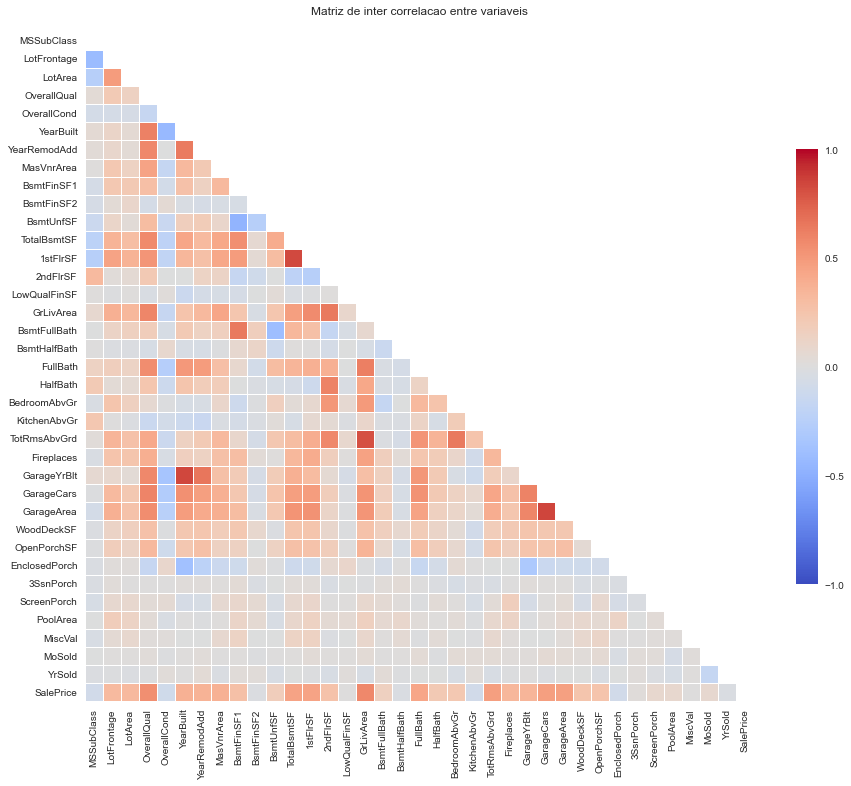

In [7]:
# Organizo um dataframe com os valores p value
linhas = df_numerical.index
colunas = df_numerical.columns

# Matriz de correlação com números
corr_matrix = df_numerical.corr()
mask = np.zeros_like(corr_matrix, dtype=np.bool)
mask[np.triu_indices_from(mask)]= True
f, ax = plt.subplots(figsize=(15, 20))

heatmap = sns.heatmap(corr_matrix,
                      mask = mask,
                      square = True,
                      linewidths = .5,
                      cmap = 'coolwarm',
                      cbar_kws = {'shrink': .4,
                                'ticks' : [-1, -.5, 0, 0.5, 1]},
                      vmin = -1,
                      vmax = 1,
                      annot = False,
                      annot_kws = {'size': 9})

#add the column names as labels
ax.set_yticklabels(corr_matrix.index)
ax.set_xticklabels(corr_matrix.columns)

sns.set_style({'xtick.bottom': True}, {'ytick.left': True})
plt.title('Matriz de inter correlacao entre variaveis\n')

## Teste de Bartlett para variâncias iguais

Este teste usa as seguintes hipóteses nulas e alternativas:

H0: A variância entre cada grupo é igual.

HA: pelo menos um grupo tem uma variação que não é igual ao resto.

Se o pvalue correspondente da estatística de teste for menor que algum nível de significância (como α = 0,05), então podemos rejeitar a hipótese nula e concluir que nem todos os grupos têm a mesma variância.

fontes:

https://www.statology.org/bartletts-test-python/

https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.bartlett.html

In [8]:
calculate_bartlett_sphericity(df_numerical.values)

(190563.5842727914, 0.0)

In [9]:
bartlett(*df_numerical.values)

BartlettResult(statistic=15199.074230134625, pvalue=0.0)

Como pvalue < 0.05 então rejeitamos H0. Então, pelo menos um grupo tem uma variação que não é igual ao resto.

Neste teste de Bartlett, o valor p é 0. O teste foi estatisticamente significativo, indicando que a matriz de correlação observada não é uma matriz de identidade.

## Teste Kaiser-Meyer-Olkin (KMO)

O teste Kaiser-Meyer-Olkin (KMO) mede a adequação dos dados para a análise fatorial. Determina a adequação para cada variável observada e para o modelo completo. KMO estima a proporção da variância entre todas as variáveis observadas. Menor proporção é mais adequado para análise fatorial. Os valores de KMO variam entre 0 e 1. O valor de KMO menor que 0,6 é considerado inadequado.

fonte: https://www.datacamp.com/community/tutorials/introduction-factor-analysis

In [10]:
kmo_all,kmo_model=calculate_kmo(df_numerical)

In [11]:
print('Valor KMO geral {}'.format(kmo_model))

Valor KMO geral 0.643390807985874


Para o exemplo da Escala IDATE: **0.78** -> **BOM**

Vamos verificar se e possivel melhorar este numero

In [12]:
print('Tabela com os valores de KMO para cada variável ordenado decrescemente')
kmo_list = pd.DataFrame(np.column_stack((df_numerical.columns,kmo_all)),columns=['Variavel','KMO']).sort_values(['KMO'],ascending=False,ignore_index=True)
kmo_list

Tabela com os valores de KMO para cada variável ordenado decrescemente


,Variavel,KMO
0,SalePrice,0.973208
1,MasVnrArea,0.970524
2,OverallQual,0.955095
3,OpenPorchSF,0.942219
4,Fireplaces,0.940316
5,WoodDeckSF,0.936721
6,TotRmsAbvGrd,0.920983
7,FullBath,0.913604
8,LotArea,0.902994
9,BsmtFullBath,0.891343


Vemos que ha variaveis com KMO menor que do 0.6. Portanto, vamos elimitar uma a uma ate que todas as variaveis possuam KMO maior fo que 0.6

In [13]:
df_numerical_new = df_numerical.copy()
variavel_pior = kmo_list.loc[kmo_list.shape[0]-1][0]
kmo_pior = kmo_list.loc[kmo_list.shape[0]-1][1]
# Retirar ate que todos os KMO estejam acima de 0.60
while kmo_pior < 0.6:    
    df_numerical_new = df_numerical_new.drop([variavel_pior],axis=1)
    kmo_all_new,kmo_model_new=calculate_kmo(df_numerical_new)

    kmo_list_new = pd.DataFrame(np.column_stack((df_numerical_new.columns,kmo_all_new)),columns=['Variavel','KMO']).sort_values(['KMO'],ascending=False,ignore_index=True)
        
    # Calculo os novos KMO
    variavel_pior = kmo_list_new.loc[kmo_list_new.shape[0]-1][0]
    kmo_pior = kmo_list_new.loc[kmo_list_new.shape[0]-1][1]

In [14]:
print('Valor KMO geral apos as exclusoes: {}'.format(kmo_model_new))

Valor KMO geral apos as exclusoes: 0.8706730087311096


Após excluões, para o exemplo da Escala IDATE: **0.87** -> **ÓTIMO**

Agora podemos seguir com a análise

In [15]:
kmo_list_new

,Variavel,KMO
0,SalePrice,0.969256
1,MasVnrArea,0.955941
2,FullBath,0.944878
3,WoodDeckSF,0.932939
4,OverallQual,0.931979
5,OpenPorchSF,0.917533
6,Fireplaces,0.915329
7,GarageCars,0.880216
8,GarageYrBlt,0.879281
9,GrLivArea,0.87469


## Escolhendo o numero de fatores

In [16]:
# Verificar os Eigenvalues (Autovalores)
fa = FactorAnalyzer(n_factors = 25, rotation=None)
fa.fit(df_numerical_new)
ev, v = fa.get_eigenvalues()

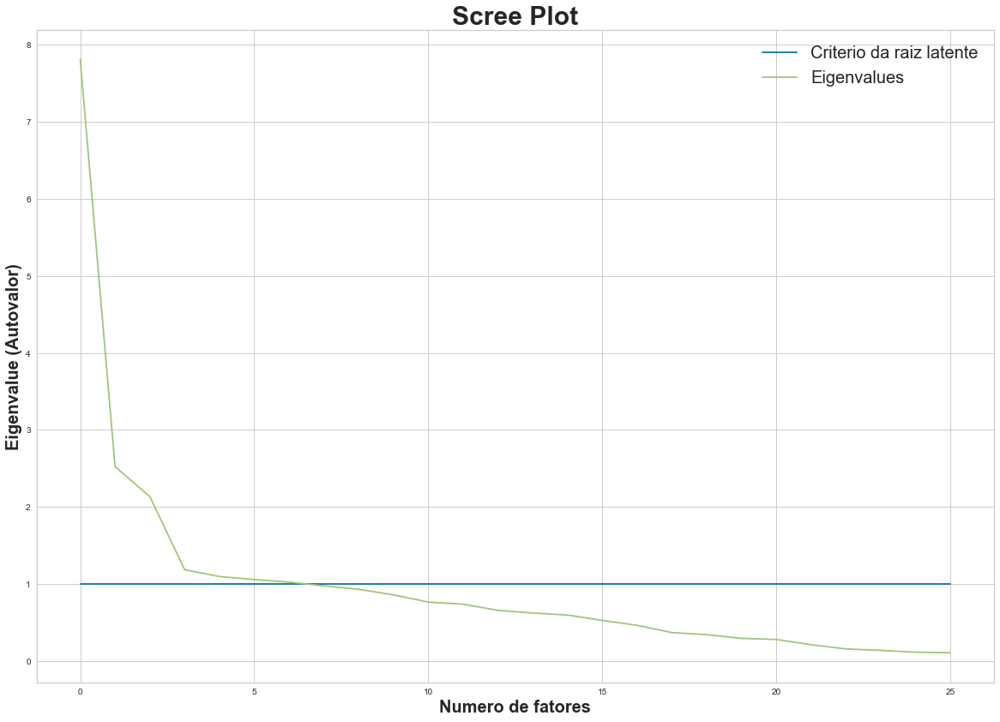

In [17]:
df_scree = pd.concat([pd.DataFrame(np.ones(ev.shape[0]),columns=['Criterio da raiz latente']),pd.DataFrame(ev,columns=['Eigenvalues'])],axis=1)
df_scree.plot(kind='line',figsize=(20,14))
plt.title('Scree Plot', fontdict = {'fontsize':30,'fontweight':'bold'})
plt.ylabel('Eigenvalue (Autovalor)',fontdict = {'fontsize':20,'fontweight':'bold'})
plt.xlabel('Numero de fatores',fontdict = {'fontsize':20,'fontweight':'bold'})
plt.legend(fontsize = 20)

**Podemos notar que apenas os autovalores de 6 fatores são maiores que um. Então, escolhemo apenas 6 fatores de acordo com o criterio da raiz latente.**

## Escolhendo o numero de fatores

### Análise Fatorial

In [18]:
# (a) varimax (orthogonal rotation)
# (b) promax (oblique rotation)
# (c) oblimin (oblique rotation)
# (d) oblimax (orthogonal rotation)
# (e) quartimin (oblique rotation)
# (f) quartimax (orthogonal rotation)
# (g) equamax (orthogonal rotation)
rotacoes = ['varimax',
            'promax',
            'oblimin',
            'oblimax',
            'quartimin',
            'quartimax',
            'equamax']

In [19]:
class analise_fatorial:
    def __init__(self,df_numerical_new, qtd_fatores):
        self.df_numerical_new=df_numerical_new
        self.qtd_fatores=qtd_fatores
        
    def gera_tabela(self,rotacao):
        # Instancio classe FactorAnalyzer
        fa = FactorAnalyzer(n_factors = self.qtd_fatores, rotation=rotacao)

        # Executa a analise para calcular as cargas para os qtd_fatores fatores
        fa.fit(self.df_numerical_new)

        # Gero a tabela de cargas rotacionadas ortogonalmente atraves do varimax
        arr_analise_fatores = fa.loadings_
        
        return arr_analise_fatores

    
    #plotar tabela heatmap das cargas entre varives X fatores
    def plotar_tabela(self,rotacao='varimax'):
        arr_analise_fatores = self.gera_tabela(rotacao)
        # Matriz de correlação com números
        corr_matrix = arr_analise_fatores
        mask = np.zeros_like(corr_matrix, dtype=np.bool)
        # mask[np.triu_indices_from(mask)]= True
        f, ax = plt.subplots(figsize=(15, 20))

        heatmap = sns.heatmap(corr_matrix,
                              mask = mask,
                              square = True,
                              linewidths = .5,
                              cmap = 'coolwarm',
                              cbar_kws = {'shrink': .4,
                                        'ticks' : [-1, -.5, 0, 0.5, 1]},
                              vmin = -1,
                              vmax = 1,
                              annot = True,
                              annot_kws = {'size': 9})

        #add the column names as labels
        sticks_linha = ['Fator ' + str(x) for x in range(arr_analise_fatores.shape[1])]
        ax.set_xticklabels(sticks_linha)
        ax.set_yticklabels(self.df_numerical_new.columns)
        plt.yticks(rotation=0)
        # sns.set_style({'xtick.top': True}, {'ytick.left': True})
        ax.xaxis.set_label_position('top')
        ax.xaxis.set_ticks_position('top')
        plt.title('Matriz de analise de fatores com rotacao {}\n'.format(rotacao))


    #Tabela de fator X quantidade de variaveis (usando o maior valor de carga como criterio)
    def gerar_tabela_fator_qtd_variaveis(self, rotacao='varimax'):
        colunas = ['Fator ' + str(x) for x in range(self.qtd_fatores)]
        linhas = self.df_numerical_new.columns
        
        arr_analise_fatores = self.gera_tabela(rotacao)
        df_carga = pd.DataFrame(arr_analise_fatores,columns=colunas)
        df_carga.index = linhas
        s = df_carga.transpose().idxmax().to_frame().value_counts()
        df_qtd_var_por_fator = pd.DataFrame(s,columns=['Quantidade variaveis por fator']).reset_index()
        df_qtd_var_por_fator.columns=['Fator','Quantidade variaveis por fator']
        df_qtd_var_por_fator = df_qtd_var_por_fator.set_index('Fator')

        return df_qtd_var_por_fator

        
    def gerar_tabela_var_fatores_rotacoes(self):
        fatores_nomes = ['Fator ' + str(x) for x in range(self.qtd_fatores)]

        aux = pd.DataFrame(fatores_nomes,columns=['Fator']).reset_index()
        aux = aux.set_index('Fator')

        rotacoes = ['varimax',
                     'promax',
                     'oblimin',
                     'oblimax',
                     'quartimin',
                     'quartimax',
                     'equamax']
        colunas_rotacoes = ['Quantidade variaveis por fator, rotacao ' + x for x in rotacoes]
        
        for indice, rot in enumerate(rotacoes):
            novo_df_fatores = self.gerar_tabela_fator_qtd_variaveis(rot)
            aux = aux.merge(novo_df_fatores,'left', left_index=True, right_index=True)
        aux = aux.drop(['index'],axis=1)
        aux.columns = colunas_rotacoes
        return aux

    def distribuicao_variavel_por_fator(self,rotacao='varimax'):
        arr_analise_fatores = self.gera_tabela(rotacao)        
        colunas = ['Fator ' + str(x) for x in range(self.qtd_fatores)]
        df_carga = pd.DataFrame(arr_analise_fatores,columns=colunas)       
        df_carga.index = self.df_numerical_new.columns
        df_separacao_variavel_fator = df_carga.transpose().idxmax().to_frame().sort_values([0])
        df_separacao_variavel_fator.columns=['Fator']
        return df_separacao_variavel_fator
    
    # Gerar a variancia de cada fator
    def gerar_variancia_fatores(self, rotacao):        
        # Instancio classe FactorAnalyzer
        fa = FactorAnalyzer(n_factors = self.qtd_fatores, rotation=rotacao)

        # Executa a analise para calcular as cargas para os qtd_fatores fatores
        fa.fit(self.df_numerical_new)
        colunas = ['Fator ' + str(x) for x in range(self.qtd_fatores)]
        df_variancia_cada_fator = pd.DataFrame(fa.get_factor_variance(),columns=colunas)
        df_variancia_cada_fator.index = [
            'SS Loadings',
            'Proportion Var',
            'Cumulative Var'    
        ]
        return df_variancia_cada_fator
    
    def gerar_comunalidades(self,rotacao):
        # Instancio classe FactorAnalyzer
        fa = FactorAnalyzer(n_factors = self.qtd_fatores, rotation=rotacao)

        # Executa a analise para calcular as cargas para os qtd_fatores fatores
        fa.fit(self.df_numerical_new)        
        df_Comunalidades = pd.DataFrame(fa.get_communalities(),columns=['Comunalidades'])
        df_Comunalidades.index = self.df_numerical_new.columns
        df_Comunalidades = df_Comunalidades.sort_values(['Comunalidades'], ascending=False)
        return df_Comunalidades

### Analise com 6 fatores

/Users/yamada/miniconda3/envs/.venv/lib/python3.9/site-packages/pandas/core/frame.py:9191: FutureWarning: Passing 'suffixes' which cause duplicate columns {'Quantidade variaveis por fator_x'} in the result is deprecated and will raise a MergeError in a future version.
  return merge(
/Users/yamada/miniconda3/envs/.venv/lib/python3.9/site-packages/pandas/core/frame.py:9191: FutureWarning: Passing 'suffixes' which cause duplicate columns {'Quantidade variaveis por fator_x'} in the result is deprecated and will raise a MergeError in a future version.
  return merge(


,"Quantidade variaveis por fator, rotacao varimax","Quantidade variaveis por fator, rotacao promax","Quantidade variaveis por fator, rotacao oblimin","Quantidade variaveis por fator, rotacao oblimax","Quantidade variaveis por fator, rotacao quartimin","Quantidade variaveis por fator, rotacao quartimax","Quantidade variaveis por fator, rotacao equamax"
Fator,,,,,,,
Fator 0,9.0,8,5,18.0,5,10,10
Fator 1,9.0,3,4,3.0,4,6,6
Fator 2,4.0,8,8,4.0,8,6,6
Fator 3,2.0,4,5,1.0,5,2,2
Fator 4,2.0,2,3,NaN,3,1,1
Fator 5,NaN,1,1,NaN,1,1,1


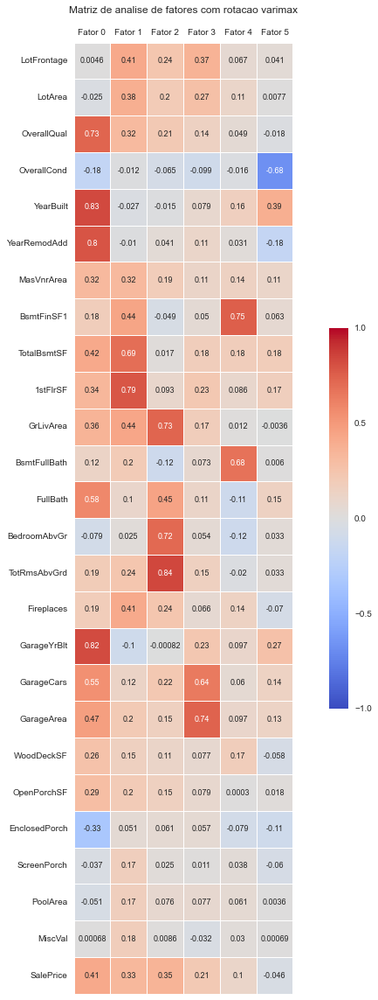

In [20]:
obj = analise_fatorial(df_numerical_new,6)
obj.plotar_tabela()
obj.gerar_tabela_var_fatores_rotacoes()

**Fator 5 ficou com zero variaveis!**

**Rodar novamente a analise com 5 fatores**

/Users/yamada/miniconda3/envs/.venv/lib/python3.9/site-packages/pandas/core/frame.py:9191: FutureWarning: Passing 'suffixes' which cause duplicate columns {'Quantidade variaveis por fator_x'} in the result is deprecated and will raise a MergeError in a future version.
  return merge(
/Users/yamada/miniconda3/envs/.venv/lib/python3.9/site-packages/pandas/core/frame.py:9191: FutureWarning: Passing 'suffixes' which cause duplicate columns {'Quantidade variaveis por fator_x'} in the result is deprecated and will raise a MergeError in a future version.
  return merge(


,"Quantidade variaveis por fator, rotacao varimax","Quantidade variaveis por fator, rotacao promax","Quantidade variaveis por fator, rotacao oblimin","Quantidade variaveis por fator, rotacao oblimax","Quantidade variaveis por fator, rotacao quartimin","Quantidade variaveis por fator, rotacao quartimax","Quantidade variaveis por fator, rotacao equamax"
Fator,,,,,,,
Fator 0,8.0,7,6,18.0,6,10,10
Fator 1,11.0,4,4,4.0,4,7,7
Fator 2,4.0,9,10,3.0,10,7,7
Fator 3,3.0,5,5,1.0,5,1,1
Fator 4,NaN,1,1,NaN,1,1,1


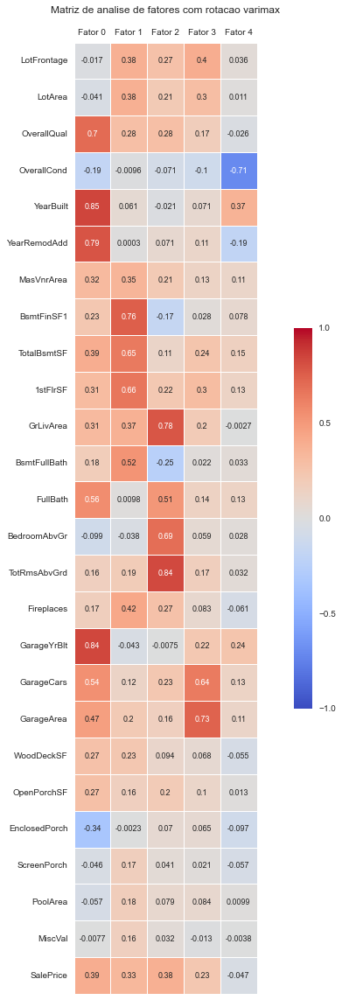

In [21]:
obj = analise_fatorial(df_numerical_new,5)
obj.plotar_tabela()
obj.gerar_tabela_var_fatores_rotacoes()

**Fator 4 ficou com zero variaveis!**

**Rodar novamente a analise com 4 fatores**

/Users/yamada/miniconda3/envs/.venv/lib/python3.9/site-packages/pandas/core/frame.py:9191: FutureWarning: Passing 'suffixes' which cause duplicate columns {'Quantidade variaveis por fator_x'} in the result is deprecated and will raise a MergeError in a future version.
  return merge(
/Users/yamada/miniconda3/envs/.venv/lib/python3.9/site-packages/pandas/core/frame.py:9191: FutureWarning: Passing 'suffixes' which cause duplicate columns {'Quantidade variaveis por fator_x'} in the result is deprecated and will raise a MergeError in a future version.
  return merge(


,"Quantidade variaveis por fator, rotacao varimax","Quantidade variaveis por fator, rotacao promax","Quantidade variaveis por fator, rotacao oblimin","Quantidade variaveis por fator, rotacao oblimax","Quantidade variaveis por fator, rotacao quartimin","Quantidade variaveis por fator, rotacao quartimax","Quantidade variaveis por fator, rotacao equamax"
Fator,,,,,,,
Fator 0,8,5,4,18,4,10,10
Fator 1,5,5,7,3,7,7,7
Fator 2,10,11,10,4,10,8,8
Fator 3,3,5,5,1,5,1,1


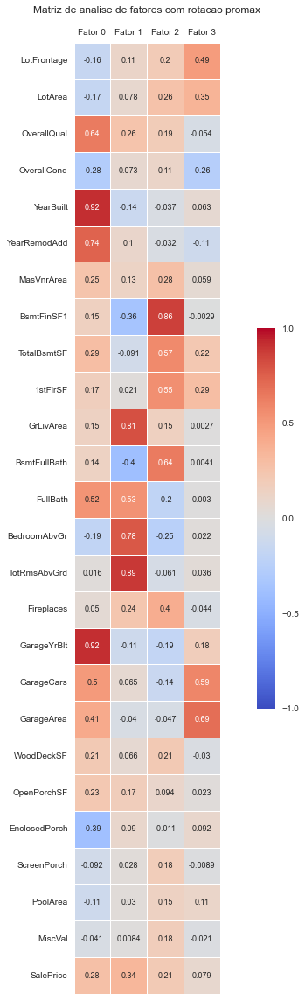

In [22]:
obj = analise_fatorial(df_numerical_new,4)
obj.plotar_tabela('promax')
obj.gerar_tabela_var_fatores_rotacoes()

**Agora parece todos os fatores ficaram com uma variavel**

**Porem, nao ficou muito bem distribuida**

**De qualquer forma, escolheu-se a rotacao promax por ter tido a melhor distribuicao**

In [23]:
df_variavel_fator = obj.distribuicao_variavel_por_fator('promax')
df_variavel_fator

,Fator
OpenPorchSF,Fator 0
OverallQual,Fator 0
GarageYrBlt,Fator 0
YearBuilt,Fator 0
YearRemodAdd,Fator 0
FullBath,Fator 1
TotRmsAbvGrd,Fator 1
BedroomAbvGr,Fator 1
GrLivArea,Fator 1
SalePrice,Fator 1


In [24]:
coluna_fatores = ['Fator ' + str(x) for x in range(4)]
for coluna in coluna_fatores:
    df_variavel_fator[coluna] = (df_variavel_fator['Fator']==coluna).apply(lambda x:int(x))
# df_variavel_fator['Fator 0'] = df_variavel_fator['Fator'].apply(lambda x:[int(('Fator ' + str(y)) == x) for y in range(4)])
# (df_variavel_fator['Fator']=='Fator 0').apply(lambda x:int(x))
# df_variavel_fator = df_variavel_fator.drop(['Fator'],axis=1)
indices_variavel_fator_originais = df_variavel_fator.index
# df_variavel_fator = df_variavel_fator.set_index('Fator')
df_variavel_fator

,Fator,Fator 0,Fator 1,Fator 2,Fator 3
OpenPorchSF,Fator 0,1,0,0,0
OverallQual,Fator 0,1,0,0,0
GarageYrBlt,Fator 0,1,0,0,0
YearBuilt,Fator 0,1,0,0,0
YearRemodAdd,Fator 0,1,0,0,0
FullBath,Fator 1,0,1,0,0
TotRmsAbvGrd,Fator 1,0,1,0,0
BedroomAbvGr,Fator 1,0,1,0,0
GrLivArea,Fator 1,0,1,0,0
SalePrice,Fator 1,0,1,0,0


In [25]:
df_variavel_fator_t = df_variavel_fator.transpose().drop(['Fator'])
df_variavel_fator_t = df_variavel_fator_t.reset_index()

In [26]:
df_variavel_fator.iloc[0][0]

'Fator 0'

(array([ 0.,  2.,  4.,  6.,  8., 10., 12.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

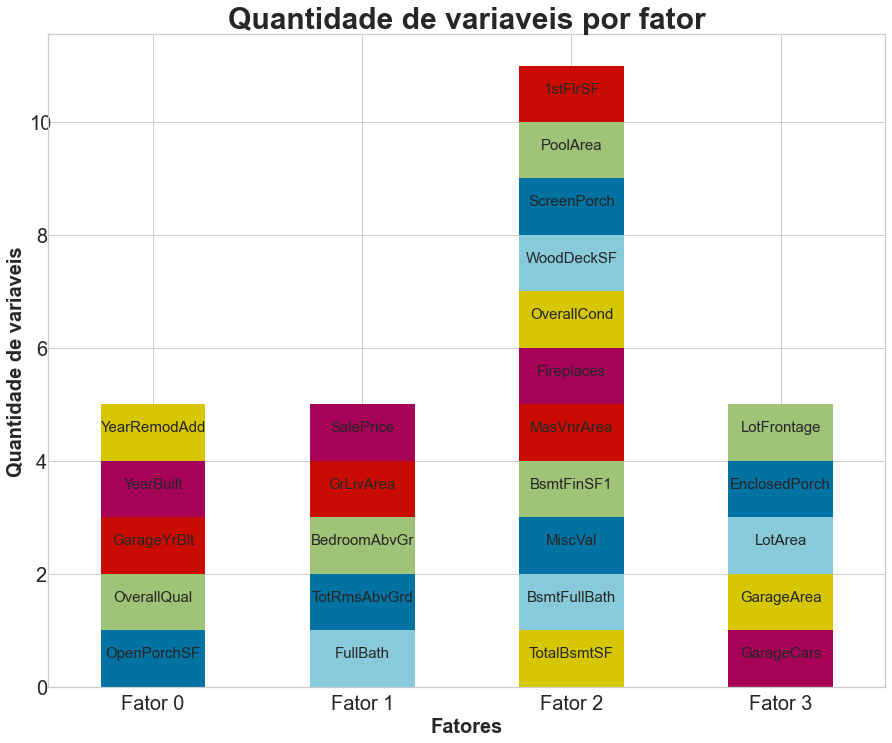

In [27]:
ax = df_variavel_fator_t.plot(kind='bar', stacked=True, legend=None, figsize=(15, 12))
# Iterrating over the bars one-by-one
# for indice, bar in enumerate(ax.patches):
#     indice_original = indice % 4
#     ax.annotate(
#                 indices_variavel_fator_originais[indice_original],
#                (bar.get_x() + bar.get_width() / 2,
#                 bar.get_y() + bar.get_height() /2), 
#                ha='center', va='center',
#                size=15, xytext=(0, 5),
#                textcoords='offset points')
indice_original = 0
for indice, bar in enumerate(ax.patches): 
    
    if (indice % 4 == 0):
        indice_original += 1
    if df_variavel_fator.iloc[indice_original-1][indice % 4 + 1] > 0:
        ax.annotate(
                    indices_variavel_fator_originais[indice_original-1],
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_y() + bar.get_height() /2), 
                   ha='center', va='center',
                   size=15, xytext=(0, 5),
                   textcoords='offset points')

plt.title('Quantidade de variaveis por fator', fontdict = {'fontsize':30,'fontweight':'bold'})
plt.ylabel('Quantidade de variaveis',fontdict = {'fontsize':20,'fontweight':'bold'})
plt.xlabel('Fatores',fontdict = {'fontsize':20,'fontweight':'bold'})
ax.set_xticklabels(coluna_fatores)
plt.xticks(rotation=0, horizontalalignment='center', fontsize = 20)
plt.yticks(rotation=0, horizontalalignment='center', fontsize = 20)

In [28]:
traducao = ["Área de varanda aberta em pés quadrados",
"Avalia o material geral e acabamento da casa",
"Ano em que a garagem foi construída",
"Data de construção original",
'Data de remodelação',
"Banheiros completos acima do nível do solo",
"Total de quartos acima do nível (não inclui banheiros)",
"Quartos acima do nível (NÃO inclui quartos no subsolo)",
"Área de estar acima do nível (solo) pés quadrados",
"Preço de venda",
"Total de pés quadrados de área do porão",
"Casas de banho completas na cave",
"$ Valor do recurso diverso",
"Tipo 1 pés quadrados acabados",
"Área de folheado de alvenaria em pés quadrados",
"Número de lareiras",
"Avalia o estado geral da casa",
"Área do deck de madeira em pés quadrados",
"Área da tela da varanda em pés quadrados",
"Área da piscina em pés quadrados",
"Pés quadrados do primeiro andar",
"Tamanho da garagem em capacidade de carro",
"Tamanho da garagem em pés quadrados",
"Tamanho do lote em pés quadrados",
"Área de varanda fechada em pés quadrados",
"Pés lineares de rua conectados à propriedade"]

(array([ 0.,  2.,  4.,  6.,  8., 10., 12.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

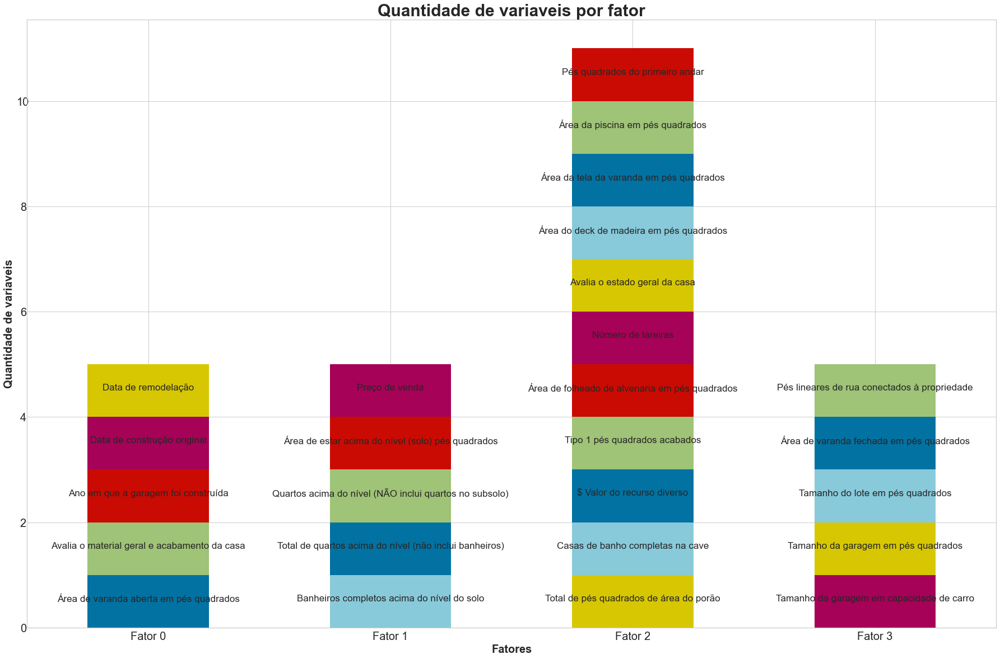

In [29]:
ax = df_variavel_fator_t.plot(kind='bar', stacked=True, legend=None, figsize=(31, 20))
# Iterrating over the bars one-by-one
# for indice, bar in enumerate(ax.patches):
#     indice_original = indice % 4
#     ax.annotate(
#                 indices_variavel_fator_originais[indice_original],
#                (bar.get_x() + bar.get_width() / 2,
#                 bar.get_y() + bar.get_height() /2), 
#                ha='center', va='center',
#                size=15, xytext=(0, 5),
#                textcoords='offset points')
indice_original = 0
for indice, bar in enumerate(ax.patches): 
    
    if (indice % 4 == 0):
        indice_original += 1
    if df_variavel_fator.iloc[indice_original-1][indice % 4 + 1] > 0:
        ax.annotate(
                    traducao[indice_original-1],
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_y() + bar.get_height() /2), 
                   ha='center', va='center',
                   size=17, xytext=(0, 5),
                   textcoords='offset points')

plt.title('Quantidade de variaveis por fator', fontdict = {'fontsize':30,'fontweight':'bold'})
plt.ylabel('Quantidade de variaveis',fontdict = {'fontsize':20,'fontweight':'bold'})
plt.xlabel('Fatores',fontdict = {'fontsize':20,'fontweight':'bold'})
ax.set_xticklabels(coluna_fatores)
plt.xticks(rotation=0, horizontalalignment='center', fontsize = 20)
plt.yticks(rotation=0, horizontalalignment='center', fontsize = 20)

In [30]:
obj.gerar_variancia_fatores('promax')

,Fator 0,Fator 1,Fator 2,Fator 3
SS Loadings,4.093435,2.986867,2.548047,1.472892
Proportion Var,0.157440,0.114879,0.098002,0.056650
Cumulative Var,0.157440,0.272319,0.370321,0.426971


Variância cumulativa total de 42% explicada pelos 4 fatores.

In [31]:
df_comunalidades = obj.gerar_comunalidades('promax')
df_comunalidades

,Comunalidades
GarageYrBlt,0.926345
BsmtFinSF1,0.895629
YearBuilt,0.866940
TotRmsAbvGrd,0.789722
BedroomAbvGr,0.701546
GrLivArea,0.700828
GarageArea,0.646467
GarageCars,0.622369
FullBath,0.598071
BsmtFullBath,0.583232


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25]),
 [Text(0, 0, 'GarageYrBlt'),
  Text(1, 0, 'BsmtFinSF1'),
  Text(2, 0, 'YearBuilt'),
  Text(3, 0, 'TotRmsAbvGrd'),
  Text(4, 0, 'BedroomAbvGr'),
  Text(5, 0, 'GrLivArea'),
  Text(6, 0, 'GarageArea'),
  Text(7, 0, 'GarageCars'),
  Text(8, 0, 'FullBath'),
  Text(9, 0, 'BsmtFullBath'),
  Text(10, 0, 'YearRemodAdd'),
  Text(11, 0, 'OverallQual'),
  Text(12, 0, 'TotalBsmtSF'),
  Text(13, 0, '1stFlrSF'),
  Text(14, 0, 'LotFrontage'),
  Text(15, 0, 'SalePrice'),
  Text(16, 0, 'LotArea'),
  Text(17, 0, 'Fireplaces'),
  Text(18, 0, 'EnclosedPorch'),
  Text(19, 0, 'OverallCond'),
  Text(20, 0, 'MasVnrArea'),
  Text(21, 0, 'WoodDeckSF'),
  Text(22, 0, 'OpenPorchSF'),
  Text(23, 0, 'PoolArea'),
  Text(24, 0, 'ScreenPorch'),
  Text(25, 0, 'MiscVal')])

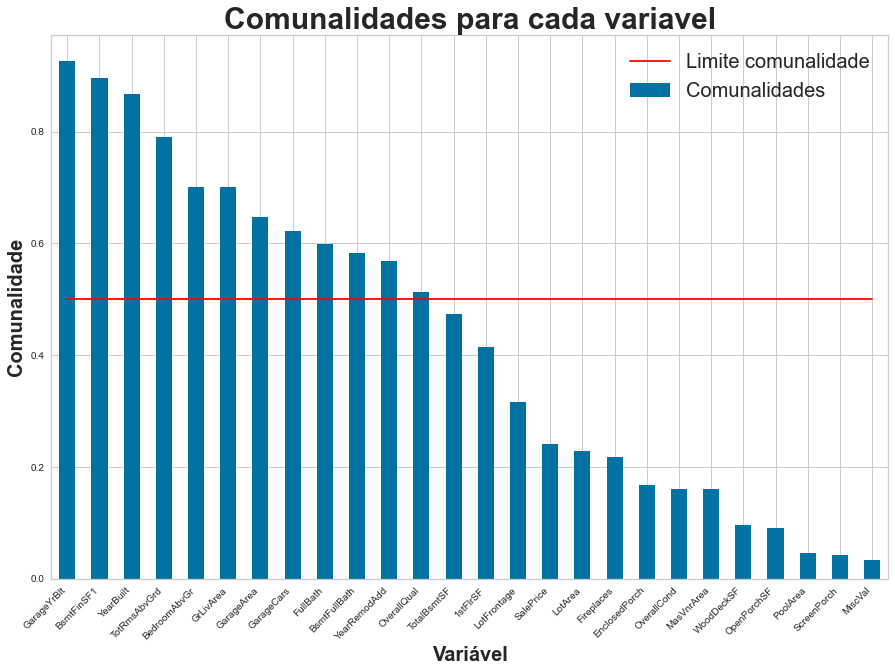

In [32]:
df_comunalidades['Limite comunalidade'] = 0.5
ax = df_comunalidades['Comunalidades'].plot(kind='bar')
df_comunalidades['Limite comunalidade'].plot(kind='line',ax=ax,color = 'red',figsize=(15,10))
plt.title('Comunalidades para cada variavel', fontdict = {'fontsize':30,'fontweight':'bold'})
plt.ylabel('Comunalidade',fontdict = {'fontsize':20,'fontweight':'bold'})
plt.xlabel('Variável',fontdict = {'fontsize':20,'fontweight':'bold'})
plt.legend(fontsize = 20)
plt.xticks(rotation=45, horizontalalignment='right')

# TODO 1: O QUE FAZER AGORA? EXCLUO VARIAVEIS COM COMUNALIDADES BAIXAS (PELO LIVRO, ABAIXO DE 0,5 PODERIA AVALIAR A EXCLUSAO)?

# TODO 2: APLICAR PCA COM 4 COMPONENTES

# Aplicando PCA

Normalizar os dados pois o PCA e influenciado pela escala dos dados

In [33]:
x = df_numerical_new.copy()
x = StandardScaler().fit_transform(x) # normalizing the features
x

array([[-0.20714411, -0.2127163 ,  0.58062759, ..., -0.06886825,
        -0.08420153,  0.44897197],
       [ 0.43560938, -0.03653398, -0.12326693, ..., -0.06886825,
        -0.08420153, -0.00488682],
       [-0.07859341,  0.21624934,  0.58062759, ..., -0.06886825,
        -0.08420153,  0.70111574],
       ...,
       [-2.09255438, -1.21710868, -1.53105595, ..., -0.06886825,
        -0.08420153, -0.28579552],
       [ 3.86362804,  1.55676694, -0.82716144, ..., -0.06886825,
        -0.08420153,  0.62921145],
       [ 0.17850799, -0.03239753,  0.58062759, ..., -0.06886825,
        -0.08420153,  0.10003637]])

In [34]:
pca_house = PCA(n_components=4)
pca_house = pca_house.fit_transform(x)
colunas = ['Fator ' + str(x) for x in range(4)]
df_pca = pd.DataFrame(pca_house,columns=colunas)
df_pca.head()

,Fator 0,Fator 1,Fator 2,Fator 3
0,1.360597,-1.211734,-0.793450,0.314231
1,0.135972,0.370122,0.545038,-1.493649
2,1.488678,-1.052838,-0.343579,0.197489
3,-0.519797,1.304642,-0.127224,1.528557
4,4.291721,0.439332,-0.936243,0.102917


In [35]:
classificacao_fator = []
for i,linha in enumerate(range(df_pca.shape[0])):
    classificacao_fator.append(df_pca.iloc[i].argmax())

df_pca['MelhorClassificacao']=classificacao_fator

(array([0, 1, 2, 3]),
 [Text(0, 0, '0'), Text(1, 0, '2'), Text(2, 0, '1'), Text(3, 0, '3')])

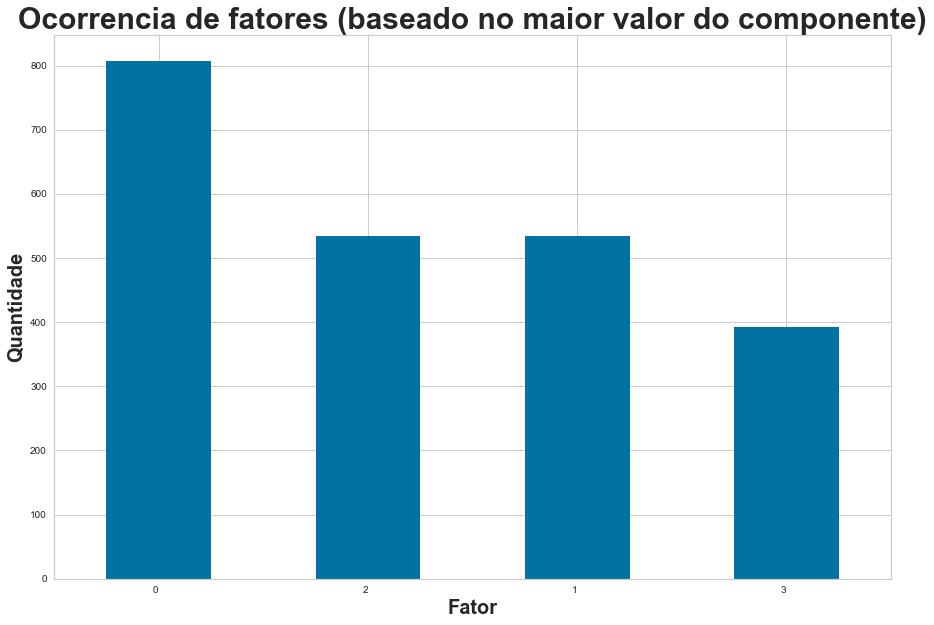

In [36]:
df_pca['MelhorClassificacao'].value_counts().to_frame().plot(kind='bar', figsize=(15,10), legend=None)
plt.title('Ocorrencia de fatores (baseado no maior valor do componente)', fontdict = {'fontsize':30,'fontweight':'bold'})
plt.ylabel('Quantidade',fontdict = {'fontsize':20,'fontweight':'bold'})
plt.xlabel('Fator',fontdict = {'fontsize':20,'fontweight':'bold'})
plt.xticks(rotation=0, horizontalalignment='right')

In [37]:
fig = make_subplots(
    rows=2, cols=2,
    specs=[[{"type": "scene"}, {"type": "scene"}],
           [{"type": "scene"}, {"type": "scene"}]],
)

fig.add_trace(go.Scatter3d(x=df_pca['Fator 0'], y=df_pca['Fator 1'],
                           z=df_pca['Fator 2'],mode="markers",                          
                             marker=dict(
                                    size=12,
                                    color=df_pca['MelhorClassificacao'],# set color to an array/list of desired values
                                    colorscale='Viridis',   # choose a colorscale
                                    opacity=0.8
                                    )),
                          row=1, col=1
             )

fig.add_trace(go.Scatter3d(x=df_pca['Fator 3'], y=df_pca['Fator 0'],
                           z=df_pca['Fator 1'],mode="markers",                          
                             marker=dict(
                                    size=12,
                                    color=df_pca['MelhorClassificacao'],# set color to an array/list of desired values
                                    colorscale='Viridis',   # choose a colorscale
                                    opacity=0.8
                                    )),
                          row=1, col=2
             )

fig.add_trace(go.Scatter3d(x=df_pca['Fator 2'], y=df_pca['Fator 3'],
                           z=df_pca['Fator 0'],mode="markers",                          
                             marker=dict(
                                    size=12,
                                    color=df_pca['MelhorClassificacao'],# set color to an array/list of desired values
                                    colorscale='Viridis',   # choose a colorscale
                                    opacity=0.8
                                    )),
                          row=2, col=1
             )

fig.add_trace(go.Scatter3d(x=df_pca['Fator 1'], y=df_pca['Fator 2'],
                           z=df_pca['Fator 3'],mode="markers",                          
                             marker=dict(
                                    size=12,
                                    color=df_pca['MelhorClassificacao'],# set color to an array/list of desired values
                                    colorscale='Viridis',   # choose a colorscale
                                    opacity=0.8
                                    )),
                          row=2, col=2
             )

fig.update_layout(
    height=1000, 
    showlegend=True,
    font_family="Courier New",
    font_color="blue",
    title_font_family="Times New Roman",
    title_font_color="black",
    legend_title_font_color="green",
    title_x=0.5
)

fig.show()

In [38]:
fig = px.scatter_3d(df_pca, x='Fator 0', y='Fator 1', z='Fator 2',
              color='Fator 3', title='<b>Gráfico entre Fator 0 x Fator 1 x Fator 2 x Fator 3</b>')
fig.update_layout(
    font_family="Courier New",
    font_color="blue",
    title_font_family="Times New Roman",
    title_font_color="black",
    legend_title_font_color="green",
    title_x=0.5
)
fig.show()

In [39]:
pca_house = PCA(n_components=3)
pca_house = pca_house.fit_transform(x)
colunas = ['Fator ' + str(x) for x in range(3)]
df_pca = pd.DataFrame(pca_house,columns=colunas)
df_pca.head()

,Fator 0,Fator 1,Fator 2
0,1.360651,-1.225046,-0.781153
1,0.135938,0.377646,0.538633
2,1.488700,-1.049601,-0.353328
3,-0.519811,1.307400,-0.129413
4,4.291752,0.430163,-0.925241


In [40]:
classificacao_fator = []
for i,linha in enumerate(range(df_pca.shape[0])):
    classificacao_fator.append(df_pca.iloc[i].argmax())

In [41]:
df_pca['MelhorClassificacao']=classificacao_fator

In [42]:
fig = px.scatter_3d(df_pca, x='Fator 0', y='Fator 1', z='Fator 2',
              color='MelhorClassificacao', title='<b>Gráfico entre Fator 0 x Fator 1 x Fator 2</b>')
fig.update_layout(
    font_family="Courier New",
    font_color="blue",
    title_font_family="Times New Roman",
    title_font_color="black",
    legend_title_font_color="green",
    title_x=0.5
)
fig.show()

(array([0, 1, 2]), [Text(0, 0, '0'), Text(1, 0, '2'), Text(2, 0, '1')])

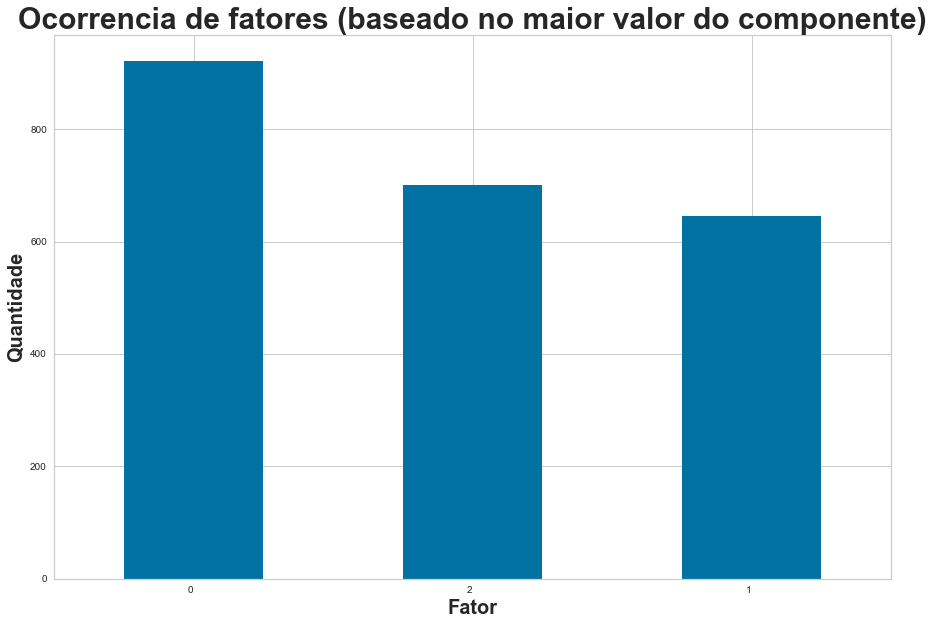

In [43]:
df_pca['MelhorClassificacao'].value_counts().to_frame().plot(kind='bar', figsize=(15,10), legend=None)
plt.title('Ocorrencia de fatores (baseado no maior valor do componente)', fontdict = {'fontsize':30,'fontweight':'bold'})
plt.ylabel('Quantidade',fontdict = {'fontsize':20,'fontweight':'bold'})
plt.xlabel('Fator',fontdict = {'fontsize':20,'fontweight':'bold'})
plt.xticks(rotation=0, horizontalalignment='right')

In [44]:
df_variavel_fator.to_excel('listaFatores.xlsx')

In [45]:
x = df_numerical_new.copy()
x = StandardScaler().fit_transform(x) # normalizing the features
pca_house = PCA(n_components=4)
pca_house = pca_house.fit(x)

In [46]:
valor_PCA_variavel_fator = pd.DataFrame(pca_house.components_)
valor_PCA_variavel_fator = valor_PCA_variavel_fator.idxmax()

In [47]:
fator_aux = [[0 for x in range(valor_PCA_variavel_fator.shape[0])] for y in range(4)]
indices = [x for x in range(26)]
valor_PCA_variavel_fator_arr = valor_PCA_variavel_fator.values

In [48]:
for i,valor in enumerate(valor_PCA_variavel_fator_arr):
    fator_aux[valor][i]=1

(array([ 0.,  2.,  4.,  6.,  8., 10., 12., 14., 16.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

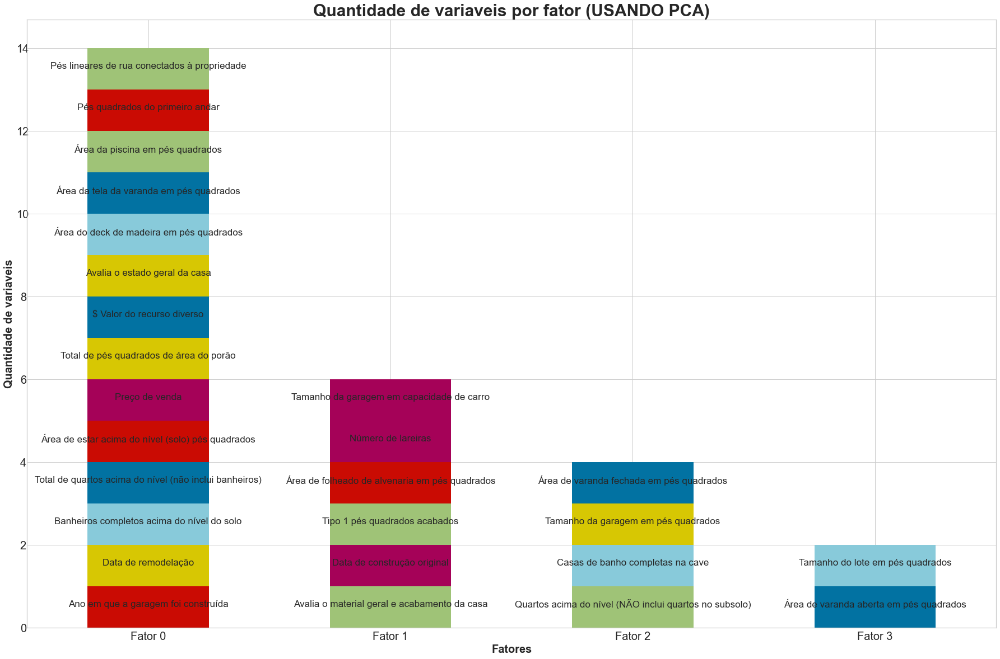

In [49]:
ax = pd.DataFrame(fator_aux).plot(kind='bar', stacked=True, legend=None, figsize=(31, 20))
# Iterrating over the bars one-by-one
# for indice, bar in enumerate(ax.patches):
#     indice_original = indice % 4
#     ax.annotate(
#                 indices_variavel_fator_originais[indice_original],
#                (bar.get_x() + bar.get_width() / 2,
#                 bar.get_y() + bar.get_height() /2), 
#                ha='center', va='center',
#                size=15, xytext=(0, 5),
#                textcoords='offset points')
indice_original = 0
for indice, bar in enumerate(ax.patches): 
    if (indice % 4 == 0):
        indice_original += 1
    if pd.DataFrame(fator_aux).transpose().iloc[indice_original-1][indice % 4] > 0:
        ax.annotate(
                    traducao[indice_original-1],
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_y() + bar.get_height() /2), 
                   ha='center', va='center',
                   size=17, xytext=(0, 5),
                   textcoords='offset points')

plt.title('Quantidade de variaveis por fator (USANDO PCA)', fontdict = {'fontsize':30,'fontweight':'bold'})
plt.ylabel('Quantidade de variaveis',fontdict = {'fontsize':20,'fontweight':'bold'})
plt.xlabel('Fatores',fontdict = {'fontsize':20,'fontweight':'bold'})
ax.set_xticklabels(coluna_fatores)
plt.xticks(rotation=0, horizontalalignment='center', fontsize = 20)
plt.yticks(rotation=0, horizontalalignment='center', fontsize = 20)

# Analise de Cluster

Etapas

1. Análise das variáveis e dos objetos a serem agrupados (seleção de variáveis, identificação de outliers e padronização)
2. Seleção da medida de distância ou semelhança entre cada par de objetos
3. Seleção do algoritmo de agrupamento: método hierárquico e método não hierárquico
4. Escolha da quantidade de agrupamentos formados
5. Interpretação e validação dos agrupamentos

Etapa 1: feito no trabalho anterior

Etapa 2: usar distancia euclidiana

Etapa 3: Escolhemos Método nao hierarquico pois são muitos exemplos (ver imagem abaixo que pode nos ajudar a justificar o motivo da escolha - tentei gerar um dendograma e travou meu notebook)


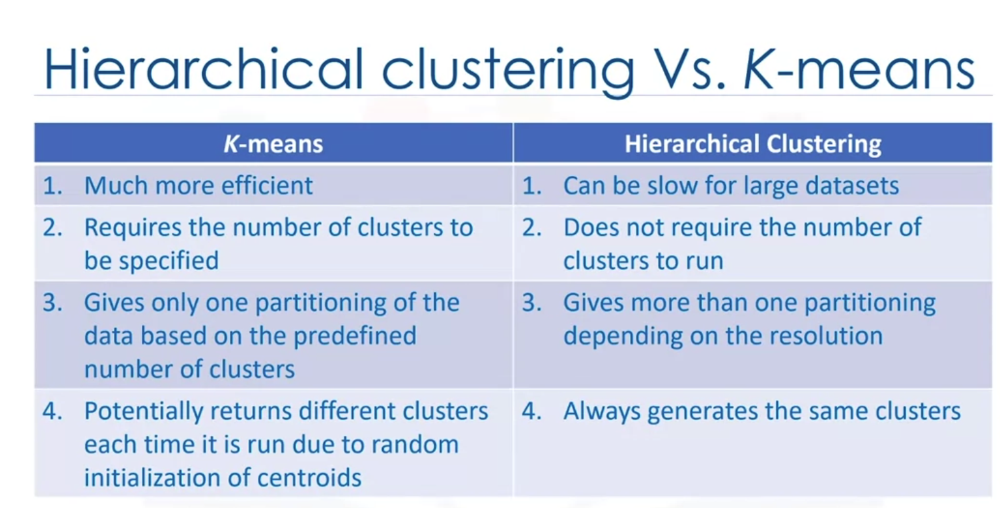

Etapa 4: usar regra do "cotovelo" (seria bom explicar a teoria)

Etapa 5: Precisa dar uma interpretada - uma ideia seria avaliar as medias, medianas, maximos, minimos dos exemplos que ficou em cada cluster e tentar interpretar

In [50]:
# Dataframe ja normalizado, com as variaveis quantitativas que estavam sendo usadas no trabalho anterior
# Neste Dataframe ja foram retiradas variaveis que nao atenderam os criterios da analise fatorial anterior
df_normalizado = pd.DataFrame(x, columns=traducao)
df_normalizado

,Área de varanda aberta em pés quadrados,Avalia o material geral e acabamento da casa,Ano em que a garagem foi construída,Data de construção original,Data de remodelação,Banheiros completos acima do nível do solo,Total de quartos acima do nível (não inclui banheiros),Quartos acima do nível (NÃO inclui quartos no subsolo),Área de estar acima do nível (solo) pés quadrados,Preço de venda,...,Avalia o estado geral da casa,Área do deck de madeira em pés quadrados,Área da tela da varanda em pés quadrados,Área da piscina em pés quadrados,Pés quadrados do primeiro andar,Tamanho da garagem em capacidade de carro,Tamanho da garagem em pés quadrados,Tamanho do lote em pés quadrados,Área de varanda fechada em pés quadrados,Pés lineares de rua conectados à propriedade
0,-0.207144,-0.212716,0.580628,-0.539198,1.006847,0.854662,0.490828,0.573333,-0.468996,-0.780172,...,0.965986,0.212726,0.254656,-0.754769,0.211062,-0.356101,-0.295498,-0.068868,-0.084202,0.448972
1,0.435609,-0.036534,-0.123267,2.272984,0.130564,-0.420083,-0.573631,1.156963,0.436866,0.245588,...,-0.064317,0.212726,-0.198734,1.677885,-0.713253,-0.356101,-0.295498,-0.068868,-0.084202,-0.004887
2,-0.078593,0.216249,0.580628,-0.539198,0.941937,0.807449,0.306177,0.101279,-0.326200,-0.618476,...,0.889667,0.212726,0.563786,-0.754769,-0.076840,-0.356101,-0.295498,-0.068868,-0.084202,0.701116
3,-0.421395,-0.044194,0.580628,-0.539198,-1.849186,-0.703360,-0.573631,-0.478061,-0.692115,-0.514889,...,0.775189,1.705760,0.738960,-0.754769,-0.182909,3.889871,-0.295498,-0.068868,-0.084202,-0.702485
4,0.607010,0.677387,1.284522,-0.539198,0.909482,0.713024,1.327190,0.463902,0.175817,-0.050013,...,0.851508,1.705760,1.738480,0.812579,0.559574,-0.356101,-0.295498,-0.068868,-0.084202,1.146570
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2262,0.435609,0.543182,-0.827161,-0.539198,-0.096620,-0.278445,0.479967,-0.686194,0.084338,0.493185,...,-0.331433,-1.280308,-0.837603,0.551354,-0.713253,-0.356101,-0.295498,-0.068868,-0.084202,0.112888
2263,-2.092554,-1.272415,-1.531056,-0.539198,-0.064165,-0.703360,-0.573631,-0.066086,-1.160664,-1.563388,...,-0.293273,-1.280308,-1.095211,-0.754769,-0.713253,-0.356101,-0.295498,-0.068868,-0.084202,-0.149156
2264,-2.092554,-1.217109,-1.531056,-0.539198,-0.064165,-0.703360,-0.573631,-0.400815,-1.160664,-1.563388,...,-0.293273,-1.280308,-1.095211,-0.754769,-0.349588,-0.356101,-0.295498,-0.068868,-0.084202,-0.285796
2265,3.863628,1.556767,-0.827161,1.335590,-0.388715,0.524172,-0.573631,1.684806,0.352081,0.149581,...,-0.674867,0.212726,0.398917,3.114621,-0.713253,-0.356101,-0.295498,-0.068868,-0.084202,0.629211


# Abordagem usando técnica hierárquica de Clusterização Aglomerativa

0    2123
2     131
1       7
3       2
dtype: int64
1    1066
0    1044
2       9
3       4
dtype: int64
0    1065
1    1042
2       2
3       1
dtype: int64
0    929
1    928
2    136
3    114
dtype: int64
0    561
3    473
1    455
2    368
dtype: int64


(array([0, 1, 2, 3]),
 [Text(0, 0, '0'), Text(1, 0, '1'), Text(2, 0, '2'), Text(3, 0, '3')])

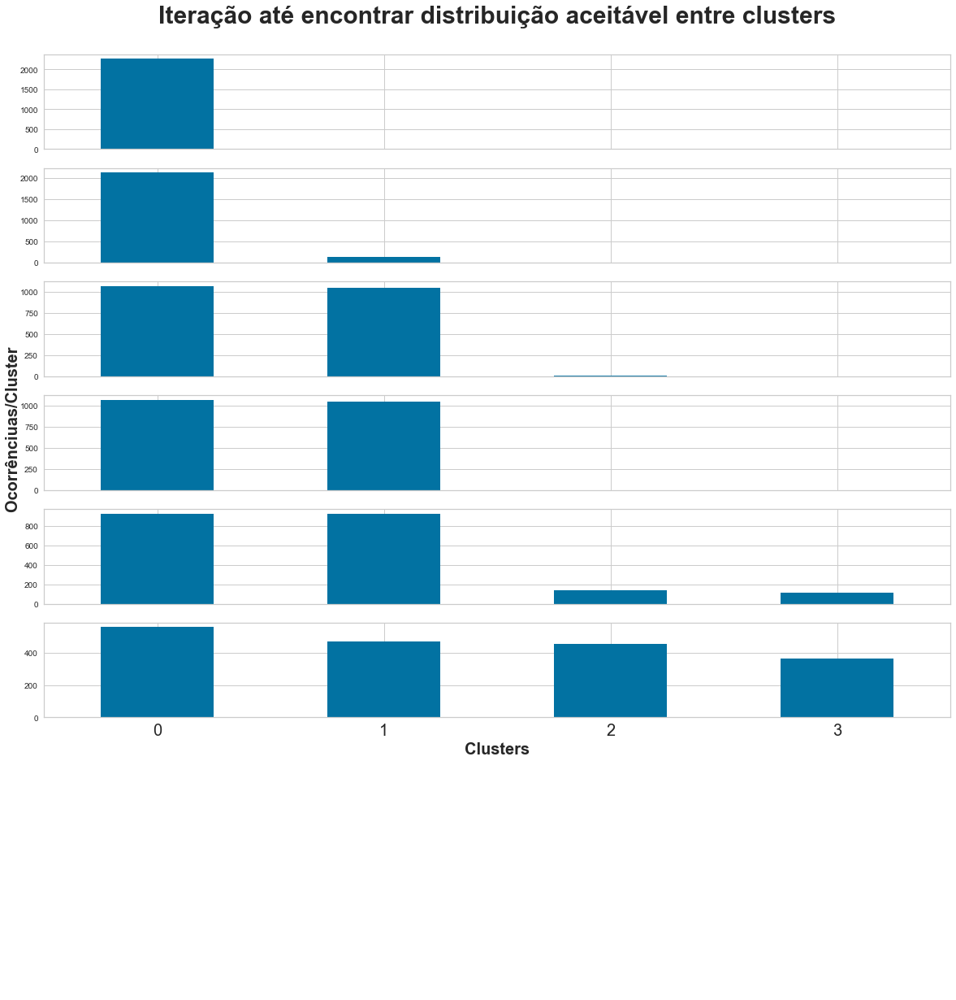

In [51]:
fig, ax = plt.subplots(6, 1, sharex=True)

df_normalizado_cluster = df_normalizado.copy()
#Save the result to a variable called agglom
agglom = AgglomerativeClustering(n_clusters = 4, linkage = 'complete')

# Fit the model with X2 and y2 from the generated data above.
agglom.fit(df_normalizado_cluster)

clusters = pd.DataFrame(agglom.labels_)
clusters.value_counts().plot(kind='bar',ax=ax[0],figsize=(20,15))

# Iterar para elimitar outliers
for iteracao in range(5):
    exemplos_excluir = []
    for c in list(map(lambda x:x[0],list(clusters.value_counts().index)))[1:]:
        # se um dos clusters tiver menos do que 150 itens, eu excluo ele da base
        if clusters.value_counts()[c] < 150:
            exemplos_excluir += list(clusters[clusters[0]==c].index)
    
    # Excluo os exemplos outliers que encontrei na etapa anterior
    df_normalizado_cluster = df_normalizado_cluster.drop(exemplos_excluir).reset_index(drop=True)

    #Save the result to a variable called agglom
    agglom = AgglomerativeClustering(n_clusters = 4, linkage = 'complete')

    # Fit the model with X2 and y2 from the generated data above.
    agglom.fit(df_normalizado_cluster)

    clusters = pd.DataFrame(agglom.labels_)
    print(clusters.value_counts())
    clusters.value_counts().plot(kind='bar',ax=ax[iteracao+1])

ax[0].set_title('Iteração até encontrar distribuição aceitável entre clusters\n', fontdict = {'fontsize':30, 'fontweight':'bold'})    
plt.ylabel('                                                                                                            Ocorrênciuas/Cluster',fontdict = {'fontsize':20,'fontweight':'bold'})

plt.xlabel('Clusters',fontdict = {'fontsize':20,'fontweight':'bold'})
ax[5].set_xticklabels([0,1,2,3])
plt.xticks(rotation=0, horizontalalignment='center', fontsize = 20)

In [52]:
# Adiciono a classificacao de cluster no dataframe analisado
df_normalizado_cluster_hierarquico = df_normalizado_cluster.copy()
df_normalizado_cluster_hierarquico['Cluster'] = clusters

Text(0.5, 0, 'Atributos')

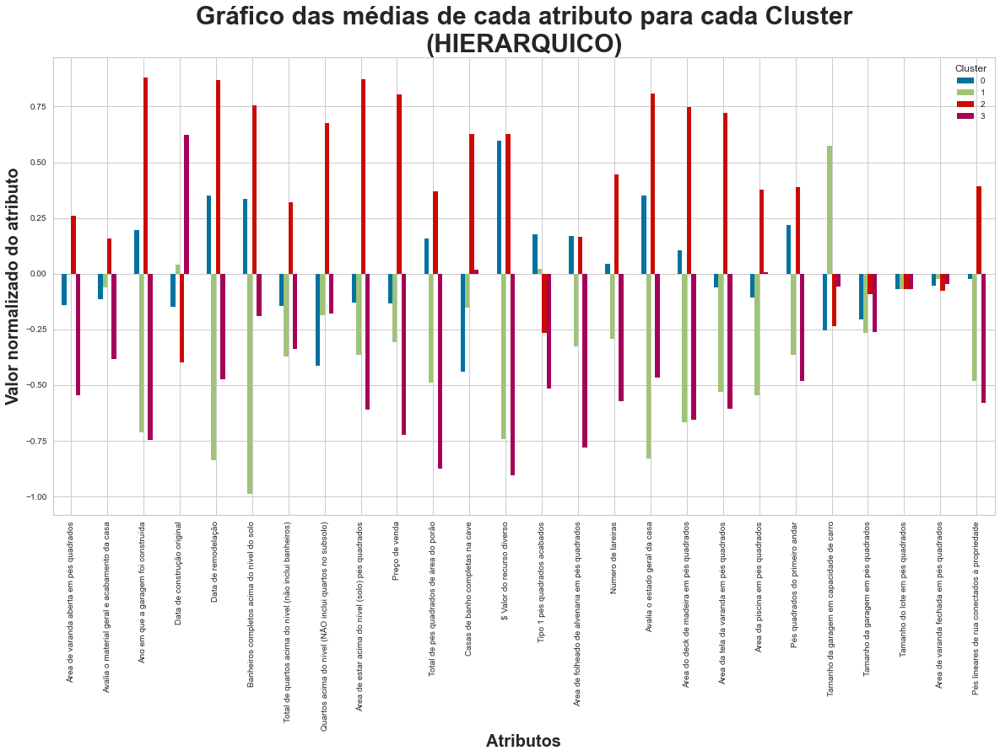

In [53]:
df_normalizado_cluster_hierarquico.groupby(['Cluster']).mean().transpose().plot(kind='bar',figsize=(20,10))
plt.title('Gráfico das médias de cada atributo para cada Cluster\n(HIERARQUICO)', fontdict = {'fontsize':30, 'fontweight':'bold'})
plt.ylabel('Valor normalizado do atributo',fontdict = {'fontsize':20,'fontweight':'bold'})
plt.xlabel('Atributos',fontdict = {'fontsize':20,'fontweight':'bold'})

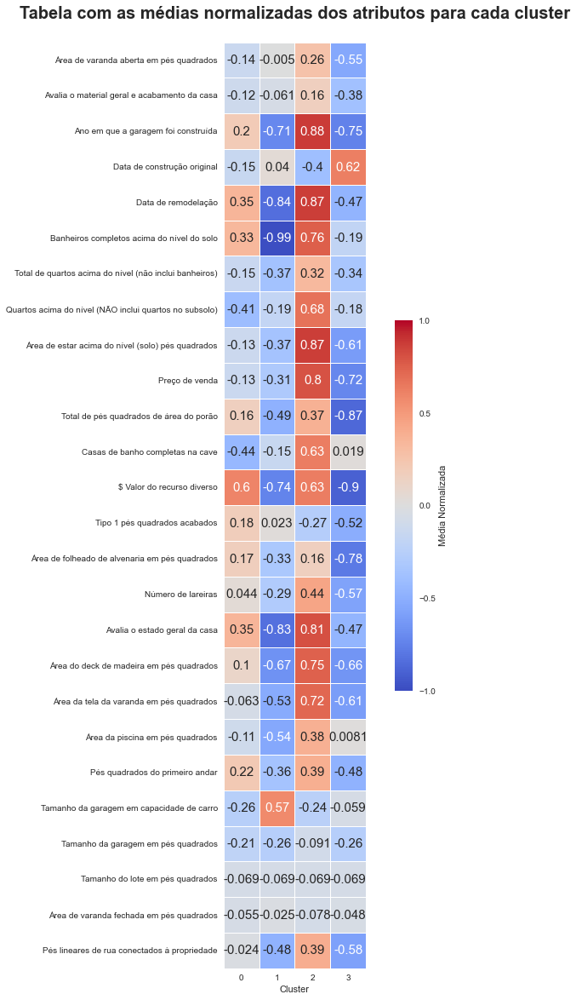

In [54]:
df_mask_hierarquico = df_normalizado_cluster_hierarquico.groupby(['Cluster']).mean().transpose()
f, ax = plt.subplots(figsize=(12, 20))

heatmap = sns.heatmap(df_mask_hierarquico,
                      square = True,
                      linewidths = .5,
                      cmap = 'coolwarm',
                      cbar_kws = {'shrink': .4,
                                'ticks' : [-1, -.5, 0, 0.5, 1],
                                 'label': 'Média Normalizada'},
                      vmin = -1,
                      vmax = 1,
                      annot = True,
                      annot_kws = {'size': 15})


plt.title('Tabela com as médias normalizadas dos atributos para cada cluster\n', fontdict = {'fontsize':20, 'fontweight':'bold'})

sns.set_style({'xtick.bottom': True}, {'ytick.left': True})

In [55]:
def colocar_rank(df_normalizado_cluster_hierarquico, atributo):
    x = list(df_normalizado_cluster_hierarquico.groupby(['Cluster']).mean()[atributos_cluster[atributo]].sort_values().reset_index().reset_index().sort_values(['Cluster'])['index'])
    return x

In [56]:
atributos_cluster = df_normalizado_cluster_hierarquico.groupby(['Cluster']).mean().columns
rank_hierarquico = []
for atributo in range(atributos_cluster.shape[0]):
    rank_hierarquico.append(
        colocar_rank(df_normalizado_cluster_hierarquico, atributo)
    )

In [57]:
rank_hierarquico

[[1, 2, 3, 0],
 [1, 2, 3, 0],
 [2, 1, 3, 0],
 [1, 2, 0, 3],
 [2, 0, 3, 1],
 [2, 0, 3, 1],
 [2, 0, 3, 1],
 [0, 1, 3, 2],
 [2, 1, 3, 0],
 [2, 1, 3, 0],
 [2, 1, 3, 0],
 [0, 1, 3, 2],
 [2, 1, 3, 0],
 [3, 2, 1, 0],
 [3, 1, 2, 0],
 [2, 1, 3, 0],
 [2, 0, 3, 1],
 [2, 0, 3, 1],
 [2, 1, 3, 0],
 [1, 0, 3, 2],
 [2, 1, 3, 0],
 [0, 3, 1, 2],
 [2, 0, 3, 1],
 [0, 1, 2, 3],
 [1, 3, 0, 2],
 [2, 1, 3, 0]]

In [58]:
rank_hierarquico.append(colocar_rank(df_normalizado_cluster_hierarquico.groupby(['Cluster']).mean()[atributos_cluster[2]]))

TypeError: colocar_rank() missing 1 required positional argument: 'atributo'

In [ ]:
list(df_normalizado_cluster_hierarquico.groupby(['Cluster']).mean()[atributos_cluster[0]])

# Abordagem usando técnica não-hierárquica K-MEANS

In [59]:
#Initialize KMeans with these parameters, where the output parameter is called k_means.
k_means = KMeans(init = "k-means++", n_clusters = 4, n_init = 100,random_state=1)
k_means.fit(df_normalizado_cluster)
clusters_nao_hierarquico = k_means.labels_
clusters_nao_hierarquico

array([2, 2, 2, ..., 3, 0, 0], dtype=int32)

In [60]:
# Adiciono a classificacao de cluster no dataframe analisado
df_normalizado_cluster_nao_hierarquico = df_normalizado_cluster.copy()
df_normalizado_cluster_nao_hierarquico['Cluster'] = clusters_nao_hierarquico

Text(0.5, 0, 'Atributos')

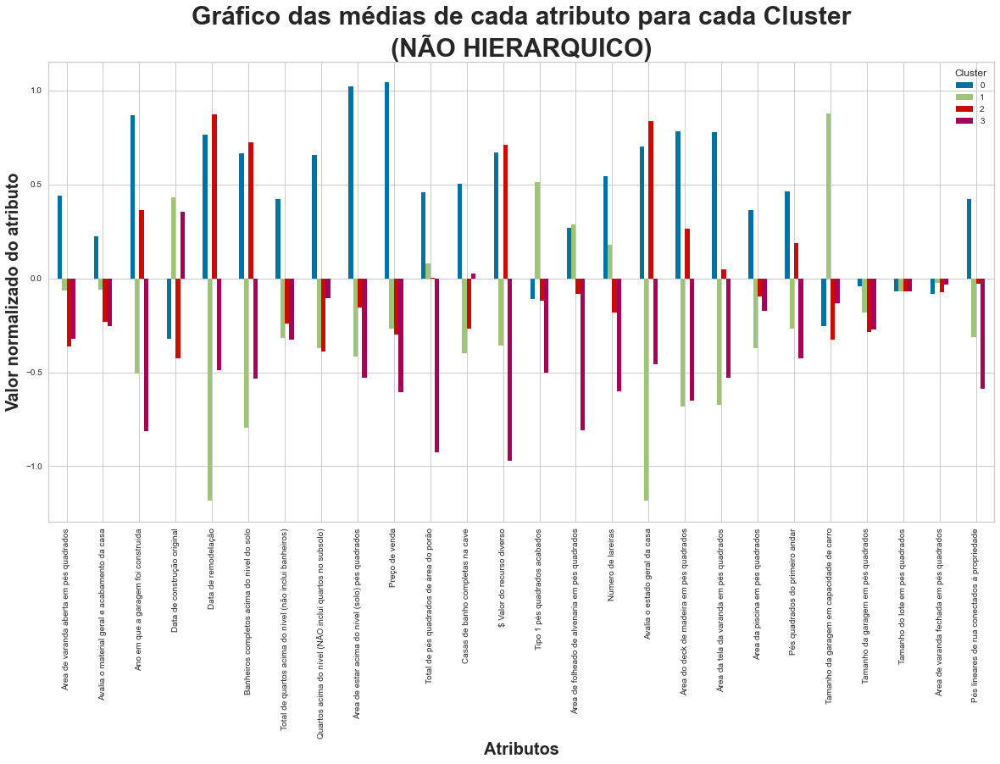

In [61]:
df_normalizado_cluster_nao_hierarquico.groupby(['Cluster']).mean().transpose().plot(kind='bar',figsize=(20,10))
plt.title('Gráfico das médias de cada atributo para cada Cluster\n(NÃO HIERARQUICO)', fontdict = {'fontsize':30, 'fontweight':'bold'})
plt.ylabel('Valor normalizado do atributo',fontdict = {'fontsize':20,'fontweight':'bold'})
plt.xlabel('Atributos',fontdict = {'fontsize':20,'fontweight':'bold'})

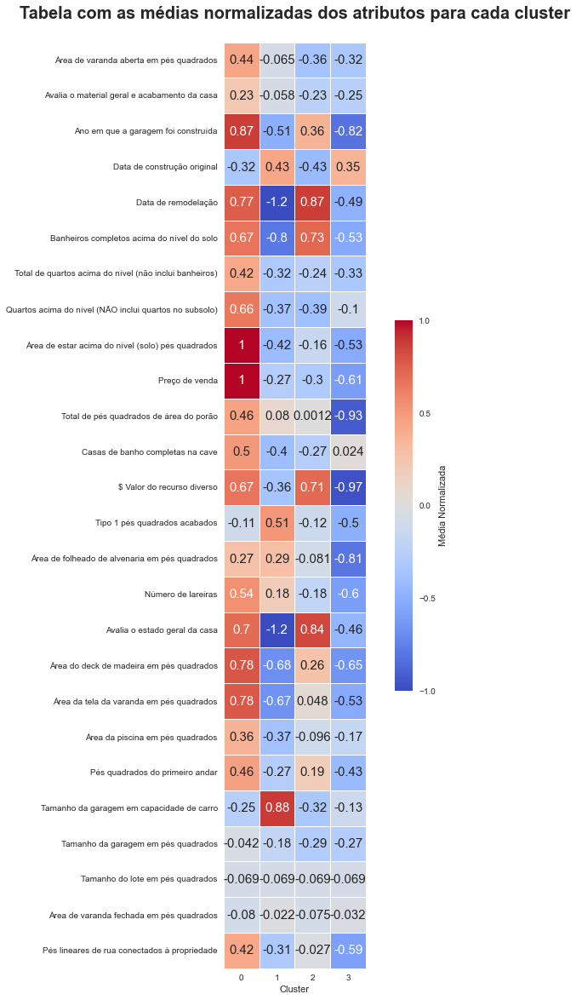

In [62]:
df_mask_nao_hierarquico = df_normalizado_cluster_nao_hierarquico.groupby(['Cluster']).mean().transpose()
f, ax = plt.subplots(figsize=(12, 20))

heatmap = sns.heatmap(df_mask_nao_hierarquico,
                      square = True,
                      linewidths = .5,
                      cmap = 'coolwarm',
                      cbar_kws = {'shrink': .4,
                                'ticks' : [-1, -.5, 0, 0.5, 1],
                                 'label': 'Média Normalizada'},
                      vmin = -1,
                      vmax = 1,
                      annot = True,
                      annot_kws = {'size': 15})

#add the column names as labels
# ax.set_yticklabels(colunas, rotation = 0)
# ax.set_xticklabels(colunas, rotation = 30)


plt.title('Tabela com as médias normalizadas dos atributos para cada cluster\n', fontdict = {'fontsize':20, 'fontweight':'bold'})

sns.set_style({'xtick.bottom': True}, {'ytick.left': True})

In [63]:
df_interpretacao = pd.DataFrame()
df_interpretacao['Cluster 0'] = df_mask_nao_hierarquico[0].apply(lambda x: 'Alta' if x > 0.4 else ('Média' if x > -0.4 else 'Baixa'))
df_interpretacao['Cluster 1'] = df_mask_nao_hierarquico[1].apply(lambda x: 'Alta' if x > 0.4 else ('Média' if x > -0.4 else 'Baixa'))
df_interpretacao['Cluster 2'] = df_mask_nao_hierarquico[2].apply(lambda x: 'Alta' if x > 0.4 else ('Média' if x > -0.4 else 'Baixa'))
df_interpretacao['Cluster 3'] = df_mask_nao_hierarquico[3].apply(lambda x: 'Alta' if x > 0.4 else ('Média' if x > -0.4 else 'Baixa'))
df_interpretacao.to_excel('df_interpretacao.xlsx')
df_interpretacao

,Cluster 0,Cluster 1,Cluster 2,Cluster 3
Área de varanda aberta em pés quadrados,Alta,Média,Média,Média
Avalia o material geral e acabamento da casa,Média,Média,Média,Média
Ano em que a garagem foi construída,Alta,Baixa,Média,Baixa
Data de construção original,Média,Alta,Baixa,Média
Data de remodelação,Alta,Baixa,Alta,Baixa
Banheiros completos acima do nível do solo,Alta,Baixa,Alta,Baixa
Total de quartos acima do nível (não inclui banheiros),Alta,Média,Média,Média
Quartos acima do nível (NÃO inclui quartos no subsolo),Alta,Média,Média,Média
Área de estar acima do nível (solo) pés quadrados,Alta,Baixa,Média,Baixa
Preço de venda,Alta,Média,Média,Baixa


# Comparando as duas abordagens

Primeira tentativa de comparar:
- Numericamente: Calculando (Valor Não Hierarquico - Valor Hierarquico) / Valor Hierarquico    

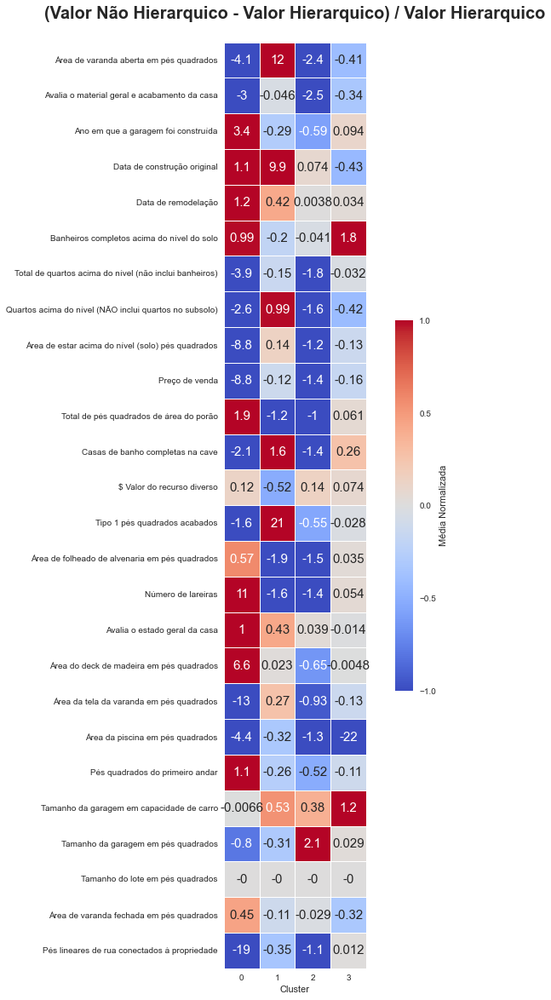

In [64]:
df_comparacao_cluster = (df_mask_nao_hierarquico - df_mask_hierarquico) / df_mask_hierarquico

f, ax = plt.subplots(figsize=(12, 20))

heatmap = sns.heatmap(df_comparacao_cluster,
                      square = True,
                      linewidths = .5,
                      cmap = 'coolwarm',
                      cbar_kws = {'shrink': .4,
                                'ticks' : [-1, -.5, 0, 0.5, 1],
                                 'label': 'Média Normalizada'},
                      vmin = -1,
                      vmax = 1,
                      annot = True,
                      annot_kws = {'size': 15})


plt.title('(Valor Não Hierarquico - Valor Hierarquico) / Valor Hierarquico\n', fontdict = {'fontsize':20, 'fontweight':'bold'})

sns.set_style({'xtick.bottom': True}, {'ytick.left': True})

In [65]:
df_comparacao = pd.merge(df_mask_hierarquico, df_mask_nao_hierarquico, left_index=True, right_index=True)
df_comparacao

Cluster,0_x,1_x,2_x,3_x,0_y,1_y,2_y,3_y
Área de varanda aberta em pés quadrados,-0.140081,-0.005042,0.258154,-0.545688,0.439764,-0.065409,-0.362719,-0.320345
Avalia o material geral e acabamento da casa,-0.115222,-0.061164,0.159337,-0.382582,0.226063,-0.058346,-0.232583,-0.254147
Ano em que a garagem foi construída,0.196685,-0.711135,0.879018,-0.745313,0.871155,-0.506021,0.364746,-0.815358
Data de construção original,-0.149870,0.039720,-0.396551,0.622140,-0.321079,0.433006,-0.425820,0.353898
Data de remodelação,0.350575,-0.836164,0.869266,-0.474278,0.765188,-1.185108,0.872611,-0.490384
Banheiros completos acima do nível do solo,0.333975,-0.989750,0.756387,-0.188312,0.665026,-0.796533,0.725056,-0.532286
Total de quartos acima do nível (não inclui banheiros),-0.145925,-0.370790,0.320743,-0.337289,0.422679,-0.315987,-0.240668,-0.326384
Quartos acima do nível (NÃO inclui quartos no subsolo),-0.411704,-0.186863,0.676245,-0.177005,0.655755,-0.372170,-0.387784,-0.103247
Área de estar acima do nível (solo) pés quadrados,-0.130699,-0.365557,0.871971,-0.610212,1.021004,-0.415524,-0.155011,-0.529809
Preço de venda,-0.134338,-0.306839,0.804659,-0.723980,1.043746,-0.269148,-0.299313,-0.606775


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25]),
 [Text(0, 0, 'Área de varanda aberta em pés quadrados'),
  Text(1, 0, 'Avalia o material geral e acabamento da casa'),
  Text(2, 0, 'Ano em que a garagem foi construída'),
  Text(3, 0, 'Data de construção original'),
  Text(4, 0, 'Data de remodelação'),
  Text(5, 0, 'Banheiros completos acima do nível do solo'),
  Text(6, 0, 'Total de quartos acima do nível (não inclui banheiros)'),
  Text(7, 0, 'Quartos acima do nível (NÃO inclui quartos no subsolo)'),
  Text(8, 0, 'Área de estar acima do nível (solo) pés quadrados'),
  Text(9, 0, 'Preço de venda'),
  Text(10, 0, 'Total de pés quadrados de área do porão'),
  Text(11, 0, 'Casas de banho completas na cave'),
  Text(12, 0, '$ Valor do recurso diverso'),
  Text(13, 0, 'Tipo 1 pés quadrados acabados'),
  Text(14, 0, 'Área de folheado de alvenaria em pés quadrados'),
  Text(15, 0, 'Número de lareiras'),
  Text(16, 0, 'Av

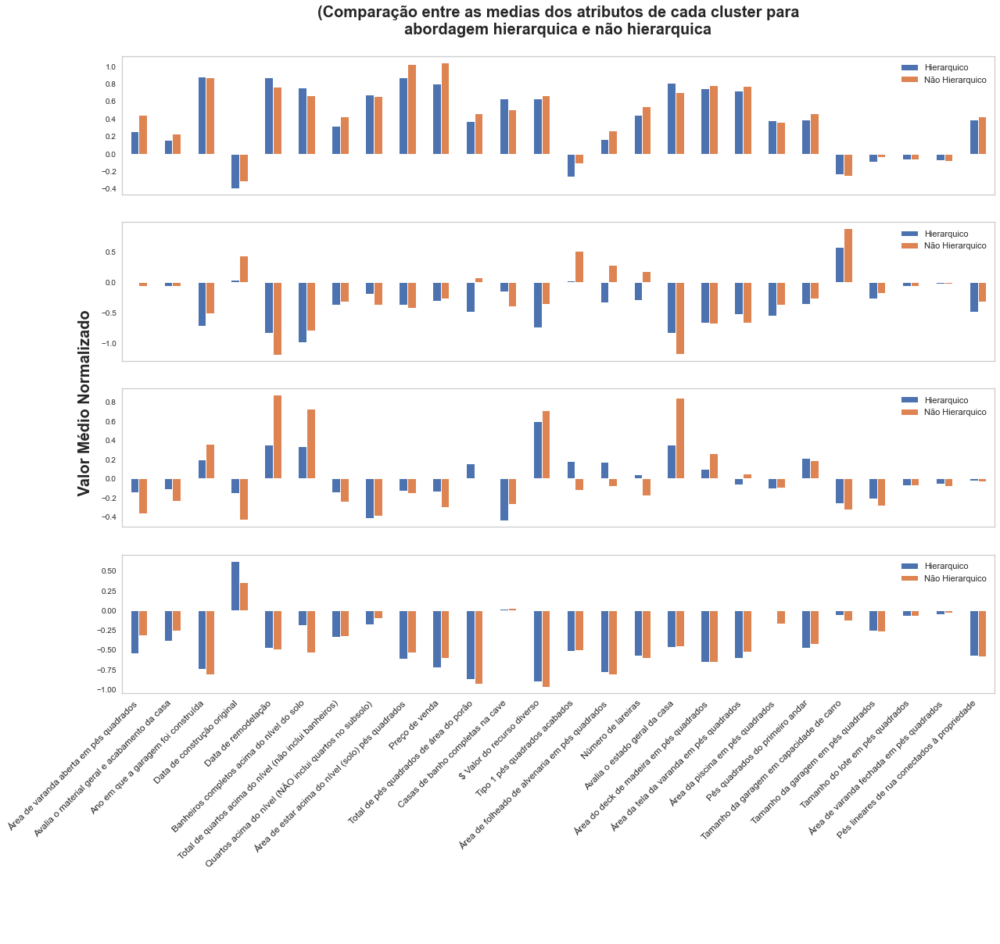

In [66]:
fig, ax = plt.subplots(4, 1, sharex=True)

sns.set_theme(style="white")
df_comparacao[['2_x','0_y']].plot(kind='bar',ax=ax[0],figsize=(20,15))
df_comparacao[['1_x','1_y']].plot(kind='bar',ax=ax[1])
df_comparacao[['0_x','2_y']].plot(kind='bar',ax=ax[2])
df_comparacao[['3_x','3_y']].plot(kind='bar',ax=ax[3])
ax[0].legend(['Hierarquico','Não Hierarquico'])
ax[1].legend(['Hierarquico','Não Hierarquico'])
ax[2].legend(['Hierarquico','Não Hierarquico'])
ax[3].legend(['Hierarquico','Não Hierarquico'])
ax[0].set_title('(Comparação entre as medias dos atributos de cada cluster para\nabordagem hierarquica e não hierarquica\n', fontdict = {'fontsize':20, 'fontweight':'bold'})
plt.ylabel('                                                                                                       Valor Médio Normalizado',fontdict = {'fontsize':20,'fontweight':'bold'})
plt.xticks(rotation=45, horizontalalignment='right', fontsize = 12)

# Plotando com o auxilio dos pesos vindo do PCA (Usando resultado do Kmeans com k=4)

In [67]:
# df_normalizado_cluster_nao_hierarquico
colunas = df_normalizado_cluster.columns
pca_cluster = PCA(n_components=2)
pca_cluster = pca_cluster.fit_transform(df_normalizado_cluster)
pca_cluster_final = pd.DataFrame(pca_cluster,columns=['Componente_1','Componente_2'])
pca_cluster_final['Cluster'] = clusters_nao_hierarquico
pca_cluster_final.head()

,Componente_1,Componente_2,Cluster
0,2.048359,-0.587795,2
1,0.528211,0.843926,2
2,2.169420,-0.363567,2
3,-0.123397,-2.173735,3
4,4.266412,0.381920,0


Text(0.5, 22.959999999999958, 'Componente_1')

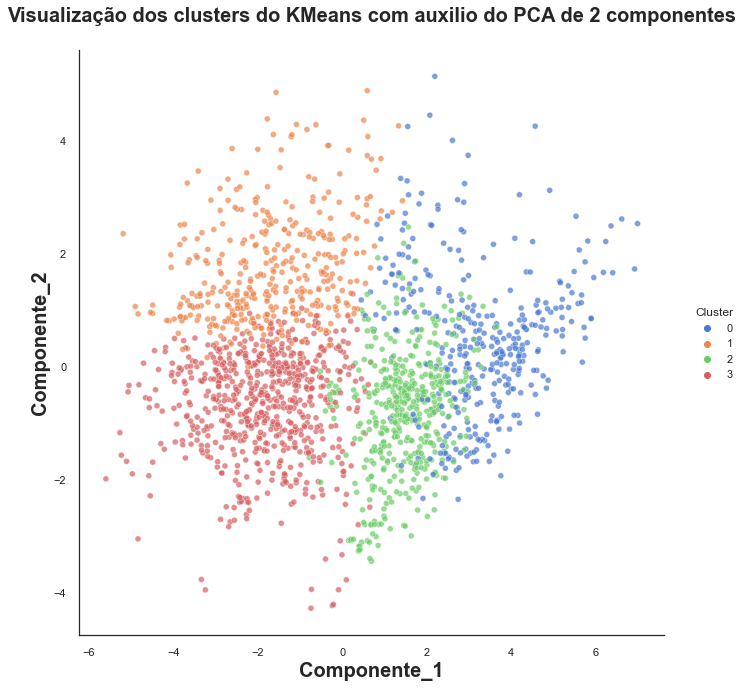

In [68]:
sns.set_theme(style="white")

# plotar
sns.relplot(x="Componente_1", y="Componente_2", hue="Cluster",
            sizes=(60, 1000), alpha=.7, palette="muted",
            height=9, aspect=1, data=pca_cluster_final)

plt.title('Visualização dos clusters do KMeans com auxilio do PCA de 2 componentes\n', fontdict = {'fontsize':20, 'fontweight':'bold'})
plt.ylabel('Componente_2',fontdict = {'fontsize':20,'fontweight':'bold'})
plt.xlabel('Componente_1',fontdict = {'fontsize':20,'fontweight':'bold'})

Text(0.5, 22.959999999999958, 'Componente_1')

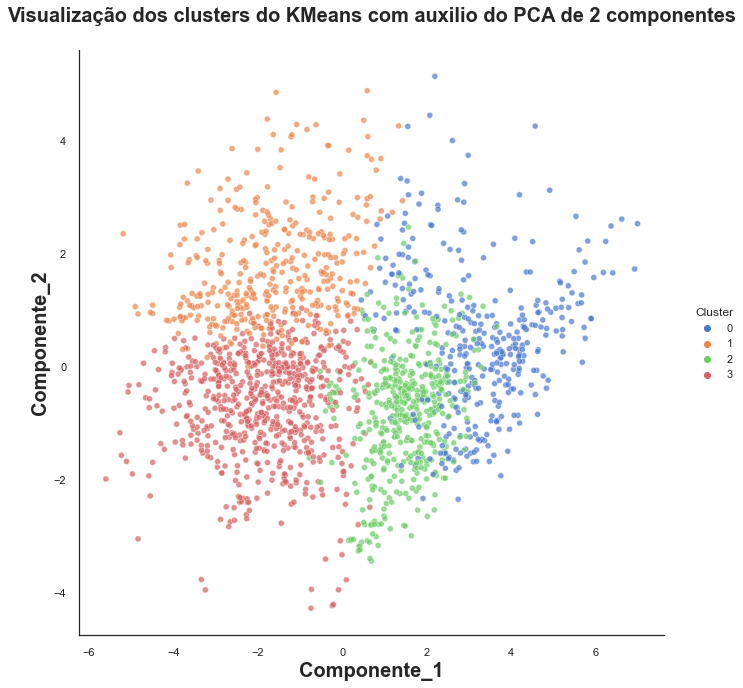

In [69]:
# df_normalizado_cluster_nao_hierarquico
colunas = df_normalizado_cluster.columns
pca_cluster = PCA(n_components=3)
pca_cluster = pca_cluster.fit_transform(df_normalizado_cluster)
pca_cluster_final = pd.DataFrame(pca_cluster,columns=['Componente_1','Componente_2','Componente_3'])
pca_cluster_final['Cluster'] = clusters_nao_hierarquico


sns.set_theme(style="white")

# plotar
sns.relplot(x="Componente_1", y="Componente_2", hue="Cluster",
            sizes=(60, 1000), alpha=.7, palette="muted",
            height=9, aspect=1, data=pca_cluster_final)

plt.title('Visualização dos clusters do KMeans com auxilio do PCA de 2 componentes\n', fontdict = {'fontsize':20, 'fontweight':'bold'})
plt.ylabel('Componente_2',fontdict = {'fontsize':20,'fontweight':'bold'})
plt.xlabel('Componente_1',fontdict = {'fontsize':20,'fontweight':'bold'})

In [70]:
pca_cluster_final['Cluster'].apply(lambda x:str(x))

0       2
1       2
2       2
3       3
4       0
       ..
1852    1
1853    3
1854    3
1855    0
1856    0
Name: Cluster, Length: 1857, dtype: object

In [71]:
import plotly.express as px

# df_normalizado_cluster_nao_hierarquico
colunas = df_normalizado_cluster.columns
pca_cluster = PCA(n_components=3)
pca_cluster = pca_cluster.fit_transform(df_normalizado_cluster)
pca_cluster_final = pd.DataFrame(pca_cluster,columns=['Componente_1','Componente_2','Componente_3'])
pca_cluster_final['Cluster'] = clusters_nao_hierarquico
pca_cluster_final['Cluster'] = pca_cluster_final['Cluster'].apply(lambda x:str(x))

fig = px.scatter_ternary(pca_cluster_final, a="Componente_1", b="Componente_2", c="Componente_3", color="Cluster", hover_name="Cluster",
                       size_max=15, color_discrete_map = {'0': "blue", '1': "green", '2':"red", '3':"yellow"},
                       title='Gráfico Ternário: Clusters do KMeans com auxilio do PCA de 3 componentes\n',
                        width=800, height=800)
fig.show()

# ANÁLISE EXTRA: Usando a Método de cotovelo para determinar um k no KMEANS

Distorção: Calcula a soma das distâncias quadradas de cada ponto até seu centroide atribuído\

Text(0.5, 1.0, 'Método do Cotovelo:\nGráfico que mostra a distorcao por k do Kmeans\n')

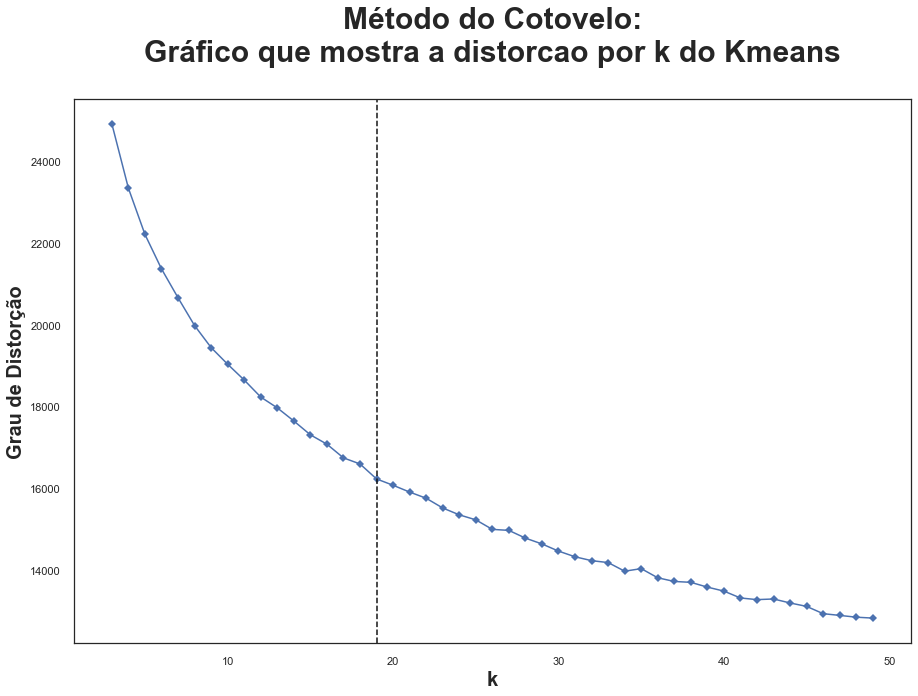

In [72]:
sns.set_theme(style="white", palette=None)

# Instantiate the clustering model and visualizer
model = KMeans()

visualizer = KElbowVisualizer(model, k=(3,50), size=(1080, 720),                             
                             timings=False)

visualizer.fit(df_normalizado_cluster)        # Fit the data to the visualizer

visualizer.ax.set_title("Grau de Distorção",fontdict = {'fontsize':40,'fontweight':'bold'})
visualizer.ax.set_ylabel("Grau de Distorção",fontdict = {'fontsize':20,'fontweight':'bold'})
visualizer.ax.set_xlabel("k",fontdict = {'fontsize':20,'fontweight':'bold'})
# visualizer.show()        # Finalize and render the figure

plt.title('Método do Cotovelo:\nGráfico que mostra a distorcao por k do Kmeans\n', fontdict = {'fontsize':30, 'fontweight':'bold'})